### Import library & Load Data

In [1]:
from util.repo_paths import AMAZON, SILVER_TIKTOK
# 라이브러리 불러오기
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime, timedelta

# 텍스트 데이터를 위한 라이브러리
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer

# 언어 감지 및 번역을 위한 라이브러리: langdetect 간편하게 사용할 수 있어서 선택, 
# Fasttext는 사전 학습된 모델을 다운 받아야 해서 미사용

# 바이그램 및 트리그램을 위한 라이브러리
from nltk.util import ngrams
from gensim.models import Phrases
from gensim.models.phrases import Phraser
from collections import Counter

# 팔레트 색상 테스트를 위한 라이브러리
from matplotlib.colors import LinearSegmentedColormap
from itertools import cycle
import plotly.graph_objects as go
import plotly.io as pio

# 틱톡커 추천을 위한 라이브러리
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

from wordcloud import WordCloud

# LDA 및 토픽 모델링을 위한 라이브러리
import gensim
from gensim.utils import simple_preprocess
# import gensim.corpora as corpora
from gensim import corpora
from pprint import pprint
import pyLDAvis

# 틱톡커 추천을 위한 라이브러리
from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster import intercluster_distance
from sklearn.metrics import silhouette_score


CWD = os.getcwd()

DATA_PATH = str(AMAZON)
print("현재 경로: ", CWD)

현재 경로:  /Users/jun/GitStudy/Data_4/src/project/project5/final_analysis_code


/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/yellowbrick/style/colors.py:35: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  mpl_ge_150 = LooseVersion(mpl.__version__) >= "1.5.0"
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/setuptools/_distutils/version.py:337: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/yellowbrick/style/rcmod.py:31: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  mpl_ge_150 = LooseVersion(mpl.__version__) >= "1.5.0"
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/setuptools/_distutils/version.py:337: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVers

#### 5. 자연어 처리

In [2]:
# 처리된 TikTok post 통합본 + 인플루언서 누적 통계 다시 로드.
# 키워드별 split이 필요 없어 통합본만 받아온다 (data_io.py의 load_keyword_dfs 참조).
from util.repo_paths import TIKTOK
from util.data_io import load_keyword_dfs

keyword_df = load_keyword_dfs()["all"]
tiktoker_df = pd.read_csv(SILVER_TIKTOK / 'tiktokers_silver.csv')


In [3]:
import re, string
# porter stemmer 초기화 및 영어 불용어 세트 생성 (캐글 참고)
stemmer = PorterStemmer()
nltk_stopwords = set(stopwords.words('english'))

# 특정 단어들을 불용어 목록에 추가
additional_stopwords = ['clean beauty', 'glow skin', 'kbeauty skin care', 'korean skincare', 'kbeauty', 'product', 'skincare', 'skin', 'beauty',
                        'Kbeauty', 'wonyoungism ', ' wonyoungism', 'wonyoungism', ' wonyoungism ', 'koreanskincare', 'Wonyoungism']
nltk_stopwords.update(additional_stopwords)

# 텍스트 전처리
def clean_text(text):
    if isinstance(text, str):
    
        # 소문자로 모두 변환
        text = text.lower()

        # URL 제거
        text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)

        # 마크다운 스타일 링크 제거
        text = re.sub(r'\[.*?\]\(.*?\)', '', text)

        # @ 제거
        text = re.sub(r'@\w+', '', text)

        # 구두점, 특수문자 제거
        text = text.translate(str.maketrans('', '', string.punctuation))

        return text
    else:
        return text

# 텍스트 토큰화
def tokenize_text(text):
    if isinstance(text, str):
        return word_tokenize(text)
    else:
        return text

# 불용어 제거
def remove_stopwords(tokens):
    if isinstance(tokens, list):
        print(f"Tokens: {tokens}")  # 중간 결과 확인
        print(f"Stopwords: {nltk_stopwords}")
        return [token for token in tokens if token not in nltk_stopwords]
    else:
        return tokens

# -> stemming 함수 추가
def stem_tokens(tokens):
    if isinstance(tokens, list):
        return [stemmer.stem(token) for token in tokens]
    else:
        return tokens

In [4]:
# keyword_df 자연어처리 저장
keyword_df['cleaned_info'] = keyword_df['info'].apply(clean_text)
keyword_df['cleaned_hash_tag'] = keyword_df['hash_tag'].apply(clean_text)

keyword_df['tokenized_info'] = keyword_df['cleaned_info'].apply(tokenize_text)
keyword_df['tokenized_hash_tag'] = keyword_df['cleaned_hash_tag'].apply(tokenize_text)

keyword_df['removed_info'] = keyword_df['tokenized_info'].apply(remove_stopwords)
keyword_df['removed_hash_tag'] = keyword_df['tokenized_hash_tag'].apply(remove_stopwords)

keyword_df['stpw_processed_info'] = keyword_df['removed_info'].apply(stem_tokens)
keyword_df['stpw_processed_hash_tag'] = keyword_df['removed_hash_tag'].apply(stem_tokens)

Tokens: ['replying', 'to', 'nontoxic', 'makeup', 'blushes', 'powder', 'cream', 'stick', 'cheek', 'stain', 'what', 'clean', 'swaps', 'do', 'you', 'want', 'to', 'see', 'next', 'brands', 'mentioned']
Stopwords: {'doesn', 'do', "she'll", 'with', "she's", 'and', 'we', "mightn't", 'myself', 'some', "they're", 'up', 'skin', 'who', "isn't", 'him', 'because', 'before', 'such', "i'd", "wasn't", 'until', 'herself', 'for', 'did', 'when', 'kbeauty', 'wonyoungism', 'about', 'nor', "didn't", 'at', "don't", 'or', 'mightn', 'o', "you're", "hasn't", 'under', 'does', "aren't", "you've", 'those', 'korean skincare', 'off', 'don', 'over', 'won', 'she', "we're", 'skincare', 'just', 'own', 'out', 'you', 'weren', "doesn't", 'can', 'product', 'whom', 'wonyoungism ', 'further', 'me', 'shouldn', 'was', 'this', 'yourselves', "he'd", "it'd", 'hasn', 'they', "won't", "weren't", 'couldn', "i've", 'there', 'which', 'so', 'ain', 'how', 'the', 'why', 'had', 'mustn', 'an', "shouldn't", 'i', "shan't", "that'll", "we'll", 

In [5]:
# tiktoker_df 자연어처리 저장
tiktoker_df = tiktoker_df.rename(columns={'info_tag': 'info'})

tiktoker_df['cleaned_info'] = tiktoker_df['info'].apply(clean_text)
tiktoker_df['cleaned_hash_tag'] = tiktoker_df['hash_tag'].apply(clean_text)

tiktoker_df['tokenized_info'] = tiktoker_df['cleaned_info'].apply(tokenize_text)
tiktoker_df['tokenized_hash_tag'] = tiktoker_df['cleaned_hash_tag'].apply(tokenize_text)

tiktoker_df['removed_info'] = tiktoker_df['tokenized_info'].apply(remove_stopwords)
tiktoker_df['removed_hash_tag'] = tiktoker_df['tokenized_hash_tag'].apply(remove_stopwords)

tiktoker_df['stpw_processed_info'] = tiktoker_df['removed_info'].apply(stem_tokens)
tiktoker_df['stpw_processed_hash_tag'] = tiktoker_df['removed_hash_tag'].apply(stem_tokens)

Tokens: ['my', 'favourite', 'blushes', 'and', 'why', 'with', 'shades💓', 'you', 'can', 'find', 'them', 'at', 'using', 'rewards', 'cde', 'mydelicate10', '💓', 'knows', 'makeup', 'of', 'hur', 'kbeauty', 'cbeauty', 'koreanmakeup', 'skincare', 'wonyoungism', 'blush']
Stopwords: {'doesn', 'do', "she'll", 'with', "she's", 'and', 'we', "mightn't", 'myself', 'some', "they're", 'up', 'skin', 'who', "isn't", 'him', 'because', 'before', 'such', "i'd", "wasn't", 'until', 'herself', 'for', 'did', 'when', 'kbeauty', 'wonyoungism', 'about', 'nor', "didn't", 'at', "don't", 'or', 'mightn', 'o', "you're", "hasn't", 'under', 'does', "aren't", "you've", 'those', 'korean skincare', 'off', 'don', 'over', 'won', 'she', "we're", 'skincare', 'just', 'own', 'out', 'you', 'weren', "doesn't", 'can', 'product', 'whom', 'wonyoungism ', 'further', 'me', 'shouldn', 'was', 'this', 'yourselves', "he'd", "it'd", 'hasn', 'they', "won't", "weren't", 'couldn', "i've", 'there', 'which', 'so', 'ain', 'how', 'the', 'why', 'had'

## PART 2: EDA & Data Analysis ( + 파생변수 생성)

#### 1. keyword_df

##### 1-1. 워드클라우드

/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/IPython/core/pylabtools.py:77: DeprecationWarning: backend2gui is deprecated since IPython 8.24, backends are managed in matplotlib and can be externally registered.
  warnings.warn(
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/IPython/core/pylabtools.py:77: DeprecationWarning: backend2gui is deprecated since IPython 8.24, backends are managed in matplotlib and can be externally registered.
  warnings.warn(
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/IPython/core/pylabtools.py:77: DeprecationWarning: backend2gui is deprecated since IPython 8.24, backends are managed in matplotlib and can be externally registered.
  warnings.warn(


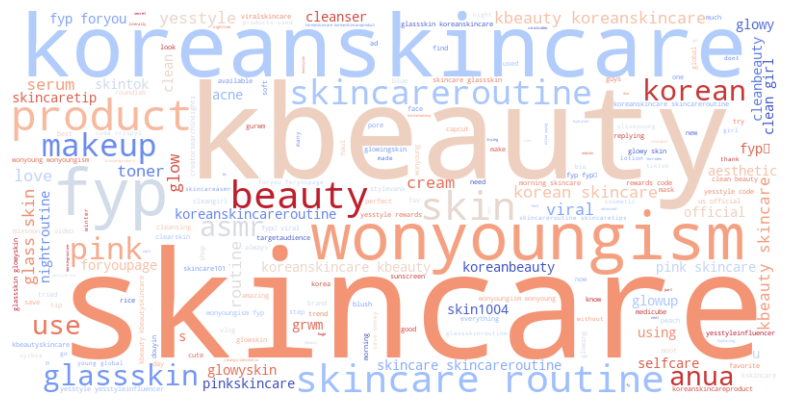

In [6]:
# keyword_df 영상설명 워드클라우드
wordcloud = WordCloud(width=800, height=400, 
                      background_color='white', colormap='coolwarm').generate(' '.join(keyword_df['cleaned_info'].dropna()))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Tiktok Vedio Information")
plt.show()

In [7]:
# keyword_df 해시태그 일렬로 정렬
tag_final_list = []
for i in range(len(keyword_df)):
    tags = str(keyword_df['hash_tag'][i])
    tags_list = tags.split(',')
    tag_final_list.append(tags_list)
tag_flat_list = sum(tag_final_list,[])
tag_df = pd.DataFrame({'tag':tag_flat_list})
tag_df

,tag
0,@user8022071884889
1,#greenscreen
2,#cleansers
3,#skincare
4,#beauty
...,...
6563,#koreanskincare
6564,#gurwm
6565,#gurwmroutine
6566,#grwm


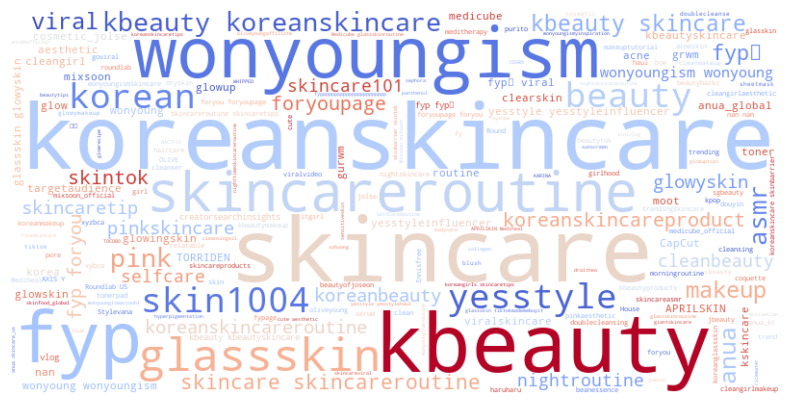

In [8]:
# keyword_df 해시태그 워드클라우드
wordcloud = WordCloud(width=800, height=400, 
                    background_color='white', colormap='coolwarm').generate(' '.join(tag_df['tag'].dropna()))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Tiktok Vedio Hash_tag")
plt.show()

##### 1-2. 자주 노출되는 인플루언서
- kbeauty인플루언서들 최신 영상 30개씩 추출할 때 사용 -> tiktoker_df생성
- 편의상 tiktoker_df 전처리도 위에서 진행함

In [9]:
# Float 형식을 일반 숫자 형식으로 변경
pd.options.display.float_format = '{:.2f}'.format

In [10]:
# kbeauty관련 키워드들 입력시 알고리즘에 의해 노출되는 모든 인플루언서들
keyword_df['tiktoker_name'].nunique()

358

In [11]:
# kbeauty관련 키워드들 입력 시 틱톡 알고리즘에 의해 3번 이상 노출된 인풀루우언서들
# 58명 / 358명명 -> tiktoker_df만들 때 사용됨 
tiktoker_cnt = keyword_df['tiktoker_name'].value_counts().reset_index()
tiktoker_cnt[tiktoker_cnt['count'] >= 3]

,tiktoker_name,count
0,mydelicate,37
1,velcroluv,33
2,caspertheghostyy,20
3,bwnniewony,17
4,milkydew,15
5,aeiezo.pdf,15
6,emchu_,14
7,songofskin,13
8,4chriisty,13
9,dearwonii_,11


##### 1-3. 업로드 일자

In [12]:
# upload_date를 20YY-MM 형식으로 변환
def upload_y_m(df):
    df['upload_date_str'] = df['upload_date'].astype(str)
    for i in range(len(df)):
        date = df['upload_date_str'][i]
        y_m = date[:7]
        df.loc[i,'upload_y_m'] = y_m

upload_y_m(keyword_df)

TypeError: 'float' object is not subscriptable

In [13]:
date_groupby = keyword_df.groupby('upload_y_m')['search_term'].count().reset_index()
date_groupby

,upload_y_m,search_term
0,2020-02,1
1,2020-03,2
2,2020-05,1
3,2020-11,1
4,2021-02,1
5,2021-03,1
6,2021-05,1
7,2021-06,1
8,2021-07,1
9,2021-08,2


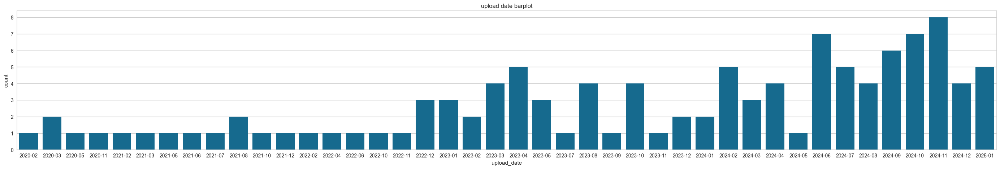

In [14]:
date_groupby = keyword_df.groupby('upload_y_m')['search_term'].count().reset_index()

fig, axes = plt.subplots(figsize=(35, 5), sharex=False)
sns.barplot(x='upload_y_m', y='search_term', data=date_groupby)
plt.title('upload date barplot')
plt.xlabel('upload_date')
plt.ylabel('count')
plt.show()

In [15]:
keyword_df.search_term.value_counts()

search_term
clean_beauty         200
kbeauty skin care    199
korean skincare      197
glow skin            187
Name: count, dtype: int64

##### 1-4. 최근 6개월 영상들 k-beauty관련 주요 해시태그

In [16]:
# 1️⃣ 최근 6개월 데이터 필터 + hash_tag - NaN 제거
recent_df = keyword_df[keyword_df['upload_date']>='2024-06-01']
recent_df = recent_df[recent_df['hash_tag'].notna()]
recent_df.head(3)

,search_term,vedio_order,tiktoker_name,upload_date,like_cnt,comment_cnt,save_cnt,info,hash_tag,cleaned_info,cleaned_hash_tag,tokenized_info,tokenized_hash_tag,removed_info,removed_hash_tag,stpw_processed_info,stpw_processed_hash_tag,upload_date_str,upload_y_m
0,clean_beauty,1,morganlkeen,2024-09-05,1563,73,894,Replying to @user8022071884889 Non-Toxic Makeu...,@user8022071884889,replying to nontoxic makeup blushes powder cr...,,"[replying, to, nontoxic, makeup, blushes, powd...",[],"[replying, nontoxic, makeup, blushes, powder, ...",[],"[repli, nontox, makeup, blush, powder, cream, ...",[],2024-09-05,2024-09
1,clean_beauty,2,therealkatiestone,2025-01-03,1337,102,189,#greenscreen new year new diagram #cleansers #...,"#greenscreen,#cleansers,#skincare,#beauty,#bea...",greenscreen new year new diagram cleansers ski...,greenscreencleansersskincarebeautybeautybrandw...,"[greenscreen, new, year, new, diagram, cleanse...",[greenscreencleansersskincarebeautybeautybrand...,"[greenscreen, new, year, new, diagram, cleanse...",[greenscreencleansersskincarebeautybeautybrand...,"[greenscreen, new, year, new, diagram, cleanse...",[greenscreencleansersskincarebeautybeautybrand...,2025-01-03,2025-01
4,clean_beauty,5,labmuffinbeautyscience,2024-06-22,5634,104,542,Clean beauty isn’t making products safer - tha...,#skincarescience,clean beauty isn’t making products safer that...,skincarescience,"[clean, beauty, isn, ’, t, making, products, s...",[skincarescience],"[clean, ’, making, products, safer, ’, problem...",[skincarescience],"[clean, ’, make, product, safer, ’, problem, m...",[skincaresci],2024-06-22,2024-06


In [17]:
# 해시태그만 추출 (# 유지)
def extract_hashtags(text):
    if isinstance(text, str):
        return re.findall(r'#\w+', text)
    return []


recent_df['tag_list'] = recent_df['hash_tag'].apply(extract_hashtags)

# 3️⃣ 리스트 형태를 개별 행으로 변환
tag_df = recent_df.explode('tag_list')[['tag_list']].rename(columns={'tag_list': 'tag'})

# 4️⃣ 공백 제거
tag_df = tag_df[tag_df['tag'].str.strip() != ""]

# 5️⃣ 태그별 등장 횟수 계산
tag_counts = tag_df['tag'].value_counts()

tag_counts


tag
#kbeauty              286
#koreanskincare       253
#skincare             247
#wonyoungism          194
#fyp                  134
                     ... 
#skincarefavorites      1
#ILLIYOONpartner        1
#일리윤                    1
#illiyoon               1
#gurwmroutine           1
Name: count, Length: 784, dtype: int64

In [18]:
tag_count =  tag_df["tag"].value_counts().reset_index()
tag_count = tag_count[tag_count['count'] >= 5]
tag_count

,tag,count
0,#kbeauty,286
1,#koreanskincare,253
2,#skincare,247
3,#wonyoungism,194
4,#fyp,134
...,...,...
130,#xybca,5
131,#kbeautymakeup,5
132,#kpopfyp,5
133,#skincareviral,5


/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 12471 (\N{KATAKANA LETTER SI}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 52628 (\N{HANGUL SYLLABLE CU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 52380 (\N{HANGUL SYLLABLE CEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


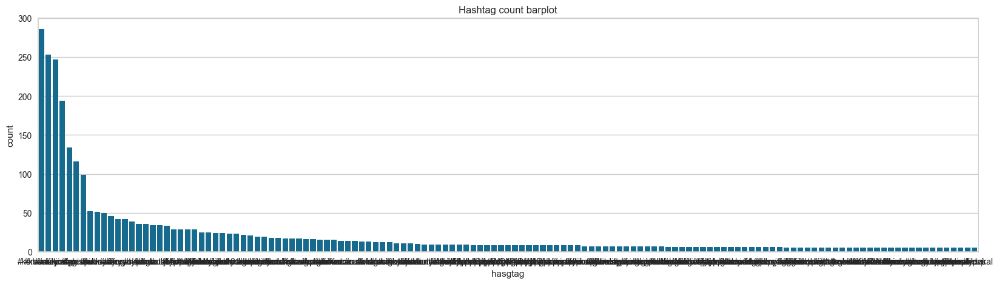

In [19]:
fig, axes = plt.subplots(figsize=(20, 5), sharex=False)
sns.barplot(x='tag', y='count', data=tag_count)
plt.title('Hashtag count barplot')
plt.xlabel('hasgtag')
plt.ylabel('count')
plt.show()

In [20]:
# 최근 6개월 상위 35개 해시태그
tag_count[tag_count['count']>=20]
# skincare, koreanskincare, kbeauty
# skincareroutine, glassskin, 
# glowyskin, viral, skintok, cleanbeauty, skincaretips, asmr, glowup, anua, pink, clearskin

# 우리 회사랑 잘 어울리는 해시태그
# skintok, #ASMR, #skincare

,tag,count
0,#kbeauty,286
1,#koreanskincare,253
2,#skincare,247
3,#wonyoungism,194
4,#fyp,134
5,#skincareroutine,116
6,#glassskin,99
7,#pink,52
8,#korean,51
9,#wonyoung,50


In [21]:
recent_df.columns

Index(['search_term', 'vedio_order', 'tiktoker_name', 'upload_date',
       'like_cnt', 'comment_cnt', 'save_cnt', 'info', 'hash_tag',
       'cleaned_info', 'cleaned_hash_tag', 'tokenized_info',
       'tokenized_hash_tag', 'removed_info', 'removed_hash_tag',
       'stpw_processed_info', 'stpw_processed_hash_tag', 'upload_date_str',
       'upload_y_m', 'tag_list'],
      dtype='str')

In [22]:
recent_df.tag_list

0                                                     []
1      [#greenscreen, #cleansers, #skincare, #beauty,...
4                                     [#skincarescience]
5                                                     []
10                  [#hygiene, #cleangirl, #hygienetips]
                             ...                        
777    [#cleanser, #acneskin, #bumpyskin, #kbeauty, #...
778    [#yslonglasting, #fyp, #kbeauty, #makeup, #kor...
780    [#koreanskincare, #skincarefavorites, #koreans...
781    [#skincare, #kbeauty, #wonyoungism, #koreanski...
782    [#ILLIYOONpartner, #일리윤, #illiyoon, #kbeauty, ...
Name: tag_list, Length: 468, dtype: object

In [23]:
recent_df.hash_tag

0                                     @user8022071884889
1      #greenscreen,#cleansers,#skincare,#beauty,#bea...
4                                       #skincarescience
5                                            @lifebylane
10                      #hygiene,#cleangirl,#hygienetips
                             ...                        
777    @WHIPPED,#cleanser,#acneskin,#bumpyskin,#kbeau...
778    #yslonglasting,#fyp,#kbeauty,#makeup,#korean,#...
780    @SUKOSHI,#koreanskincare,#skincarefavorites,#k...
781    #skincare,#kbeauty,#wonyoungism,#koreanskincar...
782    #ILLIYOONpartner,#일리윤,#illiyoon,#kbeauty,#skin...
Name: hash_tag, Length: 468, dtype: str

In [24]:
recent_df.columns

Index(['search_term', 'vedio_order', 'tiktoker_name', 'upload_date',
       'like_cnt', 'comment_cnt', 'save_cnt', 'info', 'hash_tag',
       'cleaned_info', 'cleaned_hash_tag', 'tokenized_info',
       'tokenized_hash_tag', 'removed_info', 'removed_hash_tag',
       'stpw_processed_info', 'stpw_processed_hash_tag', 'upload_date_str',
       'upload_y_m', 'tag_list'],
      dtype='str')

In [25]:
# 최근 6개월 태그 별 영상 수 및 총 좋아요 수 계산


# 1️영상 id 명시적으로 생성
tag_df = (
    recent_df
    .reset_index()                # index = 영상 id
    .rename(columns={'index': 'video_id'})
    .explode('tag_list')
    .rename(columns={'tag_list': 'tag'})
)

# 빈 태그 제거
tag_df = tag_df[
    tag_df['tag'].notna() &
    tag_df['tag'].str.startswith('#')
]

# 2️⃣ 태그별 집계
tag_count = (
    tag_df
    .groupby('tag')
    .agg(
        count=('tag', 'size'),              # 태그 등장 횟수
        video_cnt=('video_id', 'nunique'),  # ✅ 태그 포함 영상 수
        total_like=('like_cnt', 'sum')      # 영상 좋아요 합
    )
    .reset_index()
    .sort_values('video_cnt', ascending=False)
)

display(tag_count)


,tag,count,video_cnt,total_like
390,#kbeauty,286,282,14577997
420,#koreanskincare,253,249,21892345
613,#skincare,247,247,12822407
735,#wonyoungism,194,191,8664967
269,#fyp,134,134,6266383
...,...,...,...,...
352,#hugeskincare,1,1,111200
351,#howdoyounivea,1,1,26600
348,#homemade,1,1,853600
347,#holygrail,1,1,2097


In [26]:
# 최근 6개월 해시태그별 평균 좋아요수
tag_count['like_mean'] = tag_count['total_like']/tag_count['video_cnt']
tag_count

,tag,count,video_cnt,total_like,like_mean
390,#kbeauty,286,282,14577997,51695.02
420,#koreanskincare,253,249,21892345,87921.06
613,#skincare,247,247,12822407,51912.58
735,#wonyoungism,194,191,8664967,45366.32
269,#fyp,134,134,6266383,46764.05
...,...,...,...,...,...
352,#hugeskincare,1,1,111200,111200.00
351,#howdoyounivea,1,1,26600,26600.00
348,#homemade,1,1,853600,853600.00
347,#holygrail,1,1,2097,2097.00


In [27]:
# 최근 6개월간 해시태그별 영상 수 (Top 5)
# video_cnt 기준 상위 25% threshold 계산
threshold = tag_count['video_cnt'].quantile(0.75)

# 상위 20% 해시태그 추출
top20_usage_tags = (
    tag_count[tag_count['video_cnt'] >= threshold]
    .sort_values('video_cnt', ascending=False)
)

cols = ['tag','video_cnt','total_like','like_mean']

top20_usage_tags[cols]

,tag,video_cnt,total_like,like_mean
390,#kbeauty,282,14577997,51695.02
420,#koreanskincare,249,21892345,87921.06
613,#skincare,247,12822407,51912.58
735,#wonyoungism,191,8664967,45366.32
269,#fyp,134,6266383,46764.05
...,...,...,...,...
675,#tiktokshopfinds,3,20859,6953.00
381,#jellycleanser,3,32700,10900.00
489,#morningcleanser,3,198900,66300.00
398,#kbeautytiktok,3,322078,107359.33


In [28]:
top20_usage_tags[cols].head(20)

,tag,video_cnt,total_like,like_mean
390,#kbeauty,282,14577997,51695.02
420,#koreanskincare,249,21892345,87921.06
613,#skincare,247,12822407,51912.58
735,#wonyoungism,191,8664967,45366.32
269,#fyp,134,6266383,46764.05
627,#skincareroutine,114,9363334,82134.51
292,#glassskin,98,5296599,54046.93
531,#pink,52,2621321,50410.02
406,#korean,51,1754938,34410.55
734,#wonyoung,50,1872888,37457.76


In [29]:
tag_count.columns

Index(['tag', 'count', 'video_cnt', 'total_like', 'like_mean'], dtype='str')

---- 

한국 키워드 들어간 태그와 그렇지 않은 태그들의 평균 좋아요 비율

In [30]:
recent_df.tag_list

0                                                     []
1      [#greenscreen, #cleansers, #skincare, #beauty,...
4                                     [#skincarescience]
5                                                     []
10                  [#hygiene, #cleangirl, #hygienetips]
                             ...                        
777    [#cleanser, #acneskin, #bumpyskin, #kbeauty, #...
778    [#yslonglasting, #fyp, #kbeauty, #makeup, #kor...
780    [#koreanskincare, #skincarefavorites, #koreans...
781    [#skincare, #kbeauty, #wonyoungism, #koreanski...
782    [#ILLIYOONpartner, #일리윤, #illiyoon, #kbeauty, ...
Name: tag_list, Length: 468, dtype: object

In [31]:
# 해시태그별 영상 지표 리스트 생성

import numpy as np
import pandas as pd
from collections import defaultdict

# 해시태그별 지표 집계용
tag_to_metrics = defaultdict(lambda: {'like': [], 'comment': [], 'save': []})

for idx, row in recent_df.iterrows():
    for tag in row['tag_list']:
        tag_to_metrics[tag]['like'].append(row['like_cnt'])
        tag_to_metrics[tag]['comment'].append(row['comment_cnt'])
        tag_to_metrics[tag]['save'].append(row['save_cnt'])

# 데이터프레임으로 변환
tag_metrics_df = pd.DataFrame([
    {
        'tag': tag,
        'like_mean': np.mean(metrics['like']),
        'comment_mean': np.mean(metrics['comment']),
        'save_mean': np.mean(metrics['save']),
        'video_cnt': len(metrics['like'])
    }
    for tag, metrics in tag_to_metrics.items()
])


In [32]:
tag_metrics_df['tag'].value_counts()

tag
#greenscreen          1
#cleansers            1
#skincare             1
#beauty               1
#beautybrand          1
                     ..
#skincarefavorites    1
#ILLIYOONpartner      1
#일리윤                  1
#illiyoon             1
#gurwmroutine         1
Name: count, Length: 784, dtype: int64

In [33]:
# k_keyword 포함 여부 컬럼 추가
k_keyword = ["kbeauty", "koreanskincare"]
non_k_skincare = ["glassskin", "makeup", "skincareroutine", "skincare","skintok"]

def has_any(keyword_list, tag):
    return any(k in tag for k in keyword_list)

def assign_group(tag):
    if has_any(k_keyword, tag):
        return "k_keyword"
    elif has_any(non_k_skincare, tag):
        return "non_k_skincare_only"
    else:
        return "others"

tag_metrics_df["group"] = tag_metrics_df["tag"].apply(assign_group)

In [34]:
compare_df = tag_metrics_df[
    tag_metrics_df["group"].isin(["k_keyword", "non_k_skincare_only"])
]

In [35]:
# 1️⃣ 그룹별 평균 확인
grouped = compare_df.groupby("group")[["like_mean", "comment_mean", "save_mean"]].mean()

print("그룹별 평균값")
print(grouped)

그룹별 평균값
                     like_mean  comment_mean  save_mean
group                                                  
k_keyword            148428.58       1540.31   39261.99
non_k_skincare_only   96603.45        595.77   13415.67


In [36]:
# 2️⃣ 증가율 계산 (k_keyword vs others)

increase_pct = (
    (grouped.loc["k_keyword"] - grouped.loc["non_k_skincare_only"])
    / grouped.loc["non_k_skincare_only"]
    * 100
).round(2)

print("\nK-beauty 키워드 포함 태그 vs 일반 skincare 태그 평균 증가율(%)")
print(increase_pct)



K-beauty 키워드 포함 태그 vs 일반 skincare 태그 평균 증가율(%)
like_mean       53.65
comment_mean   158.54
save_mean      192.66
dtype: float64


In [37]:
# 3️⃣ 문장 형태로 출력
for metric in ["like_mean", "comment_mean", "save_mean"]:
    pct = increase_pct[metric]
    print(
        f"{metric.replace('_mean','').capitalize()} 기준으로 "
        f"K-beauty 태그가 일반 skincare 태그 대비 {pct}% 높다."
    )


Like 기준으로 K-beauty 태그가 일반 skincare 태그 대비 53.65% 높다.
Comment 기준으로 K-beauty 태그가 일반 skincare 태그 대비 158.54% 높다.
Save 기준으로 K-beauty 태그가 일반 skincare 태그 대비 192.66% 높다.


통계 검정 (독립표본 비교)

In [38]:
#shapiro(group_A)를 사용하면 : 표본 수가 많을수록 거의 항상 기각된다.

# from scipy.stats import shapiro, levene, ttest_ind, mannwhitneyu

# def compare_groups(metric):
#     group_A = tag_metrics_df[tag_metrics_df['group']=='k_keyword'][metric]
#     group_B = tag_metrics_df[
#         tag_metrics_df['group'] == 'non_k_skincare_only'
#     ][metric]


#     # 정규성
#     pA = shapiro(group_A)[1]
#     pB = shapiro(group_B)[1]

#     # 등분산성
#     p_levene = levene(group_A, group_B)[1]

#     # 검정 선택
#     if pA > 0.05 and pB > 0.05:
#         if p_levene > 0.05:
#             test, p = ttest_ind(group_A, group_B, equal_var=True)
#             method = f"{metric} 독립표본 t-test(등분산)"
#         else:
#             test, p = ttest_ind(group_A, group_B, equal_var=False)
#             method = f"{metric} Welch t-test(이분산)"
#     else:
#         test, p = mannwhitneyu(group_A, group_B, alternative='two-sided')
#         method = f"{metric} Mann-Whitney U test (비모수)"

#     print(f"{method} → 통계량: {test:.3f}, p-value: {p:.4f}")

# # 좋아요, 댓글, 저장 각각 검정
# for metric in ['like_mean','comment_mean','save_mean']:
#     compare_groups(metric)


| 상황               | 권장           |
| ---------------- | ------------ |
| 표본 수 충분 (n > 30) | Welch t-test |
| 분포 왜곡 심함         | Mann–Whitney |
| 분산 다름            | Welch t-test |

즉, Welch t-test를 기본값으로 두고보조적으로 비모수 검정 확인

In [39]:
from scipy.stats import levene, ttest_ind, mannwhitneyu
import numpy as np

def compare_groups(metric):
    group_A = tag_metrics_df[
        tag_metrics_df['group'] == 'k_keyword'
    ][metric].dropna()

    group_B = tag_metrics_df[
        tag_metrics_df['group'] == 'non_k_skincare_only'
    ][metric].dropna()

    # 등분산성만 확인 (Welch 여부 판단용)
    p_levene = levene(group_A, group_B)[1]

    # Welch t-test (기본)
    t_stat, p_t = ttest_ind(group_A, group_B, equal_var=False)

    # 비모수 검정 (보조 확인)
    u_stat, p_u = mannwhitneyu(group_A, group_B, alternative='two-sided')

    print(f"\n[{metric}]")
    print(f"Welch t-test → t={t_stat:.3f}, p={p_t:.4f}")
    print(f"Mann-Whitney U → U={u_stat:.3f}, p={p_u:.4f}")


for metric in ['like_mean','comment_mean','save_mean']:
    compare_groups(metric)



[like_mean]
Welch t-test → t=1.019, p=0.3180
Mann-Whitney U → U=1076.000, p=0.0298

[comment_mean]
Welch t-test → t=2.666, p=0.0156
Mann-Whitney U → U=1218.000, p=0.0009

[save_mean]
Welch t-test → t=1.684, p=0.1105
Mann-Whitney U → U=1094.000, p=0.0204


### 해석
K-beauty 키워드가 포함된 해시태그는 평균 반응도는 명확히 높다고 말하기 어렵지만,
분포 전체에서는 일반 skincare 태그 대비 유의미하게 우세하다.

1. like_mean (평균 좋아요)

| 검정           | p-value | 해석              |
| ------------ | ------- | --------------- |
| Welch t-test | 0.2861  | 평균 차이 **유의 아님** |
| Mann–Whitney | 0.0249  | 분포 차이 **유의**    |

의미
- 평균은 일부 **초대형 태그(outlier)**에 크게 흔들림
- 그러나 중앙값 이상 비율, 전반적인 분포 위치는 K-beauty 쪽이 우세함.
바이럴 빈도는 더 높다고 해석하는 것이 맞다.



2. comment_mean (평균 댓글)

| 검정           | p-value | 해석               |
| ------------ | ------- | ---------------- |
| Welch t-test | 0.0145  | 평균 차이 **유의**     |
| Mann–Whitney | 0.0007  | 분포 차이 **강하게 유의** |

의미
- 평균도 높고, 분포 전체도 우측 이동
- 가장 강한 효과 지표로 K-beauty 태그는 **참여 유도(engagement depth)**에 명확한 효과를 가지고 있다.

3. save_mean (평균 저장)

| 검정           | p-value | 해석                |
| ------------ | ------- | ----------------- |
| Welch t-test | 0.0999  | 평균 차이 **경계적 비유의** |
| Mann–Whitney | 0.0159  | 분포 차이 **유의**      |


의미
- 일부 고저장 태그가 평균을 끌어내림. 하지만 대다수 태그에서는 저장 반응이 더 높음
- 실용 정보성 콘텐츠 효과를 나타낸다.

왜 이런 패턴이 나오는가? (데이터 구조 관점) 

| 현상         | 원인             |
| ---------- | -------------- |
| t-test 비유의 | 평균이 극단값에 민감    |
| U-test 유의  | 순위 기반 → robust |
| 댓글에서 가장 강함 | 커뮤니티·문화 정체성 반응 |

K-beauty 효과는 “일부 대박”이 아니라 “다수 콘텐츠의 일관된 우위” 형태로 나타난다.

“k-beauty 태그는 평균 반응이 일부 지표에서는 높게 나타났으나,
평균 차이를 일반화할 만큼 일관적이라고 보기는 어렵다.
다만 분포 전반에서는 대부분의 경우 더 높은 반응을 보였다.”

극단적인 바이럴 몇 개가 평균을 끌어올리는 구조가 아니라,
다수 콘텐츠에서 안정적으로 반응이 더 높게 나타난다.”

In [40]:
metrics = ['like_mean', 'comment_mean', 'save_mean']

median_summary = (
    tag_metrics_df
    .groupby('group')[metrics]
    .median()
    .round(2)
)

print("그룹별 지표 중앙값 (Median)")
display(median_summary)

그룹별 지표 중앙값 (Median)


,like_mean,comment_mean,save_mean
group,,,
k_keyword,76000.00,1165.00,13700.00
non_k_skincare_only,29233.33,286.86,5113.00
others,15052.24,170.50,2364.00


좋아요 (Like)
- k_keyword: 76,000
- non_k_skincare_only 대비 2.6배
- others 대비 5.0배

댓글 (Comment)
- k_keyword: 1,165
- non_k_skincare_only 대비 약 4.1배
- others 대비 약 6.5배

저장 (Save)
- k_keyword: 13,700
- non_k_skincare_only 대비 약 2.7배
- others 대비 약 5.7배

K-beauty 키워드를 포함한 콘텐츠는 단순 노출 증가가 아니라,
댓글·저장 등 고관여 지표에서 구조적인 반응성 우위를 보인다.

---

In [41]:
# 1) 영상 수가 적어 의미 없는 평균 제거
Q1 = tag_count["video_cnt"].quantile(0.25)
filtered = tag_count[tag_count["video_cnt"] >= Q1]

# 2) like_mean 기준 상위 20% threshold
threshold = filtered['like_mean'].quantile(0.80)

# 3) filtered 안에서 상위 20% 선택
top20_liked_tags = (
    filtered[filtered['like_mean'] >= threshold]
    .sort_values('like_mean', ascending=False)
)

top20_liked_tags[cols]

,tag,video_cnt,total_like,like_mean
156,#brookemonk,1,3500000,3500000.00
691,#tutorial,1,3500000,3500000.00
517,#oilcleansing,1,2400000,2400000.00
110,#asmrcleaning,1,2000000,2000000.00
190,#cleantok,1,2000000,2000000.00
...,...,...,...,...
692,#tutorialmakeup,1,104600,104600.00
567,#relatable,9,874300,97144.44
387,#jumisopartner,1,96700,96700.00
690,#trueclean,1,96700,96700.00


/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_76470/3498666097.py:20: UserWarning: Glyph 12471 (\N{KATAKANA LETTER SI}) missing from current font.
  fig.tight_layout()
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_76470/3498666097.py:20: UserWarning: Glyph 52628 (\N{HANGUL SYLLABLE CU}) missing from current font.
  fig.tight_layout()
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_76470/3498666097.py:20: UserWarning: Glyph 52380 (\N{HANGUL SYLLABLE CEON}) missing from current font.
  fig.tight_layout()
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_76470/3498666097.py:20: UserWarning: Glyph 49828 (\N{HANGUL SYLLABLE SEU}) missing from current font.
  fig.tight_layout()
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_76470/3498666097.py:20: UserWarning: Glyph 53416 (\N{HANGUL SYLLABLE KIN}) missing from current font.
  fig.tight_layout()
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_76470/3498666097.py:20: UserWarn

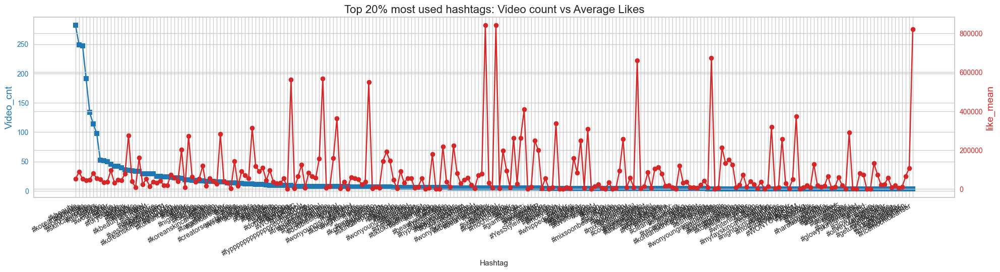

In [42]:
# 최근 6개월 사용량 상위20% 해시태그들의 사용된 영상 개수 대비 평균 좋아요 수

# left side : vedio_cnt
fig, ax1 = plt.subplots(figsize=(20, 5), sharex=False)
color_1 = 'tab:blue'
ax1.set_title('Top 20% most used hashtags: Video count vs Average Likes', fontsize=16)
ax1.set_xlabel('Hashtag')
ax1.set_ylabel('Video_cnt', fontsize=14, color=color_1)
ax1.plot(top20_usage_tags.tag, top20_usage_tags.video_cnt, marker='s', color=color_1)
ax1.tick_params(axis='y', labelcolor=color_1)

# right side : like_mean
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
color_2 = 'tab:red'
ax2.set_ylabel('like_mean', fontsize=14, color=color_2)
ax2.plot(top20_usage_tags.tag, top20_usage_tags.like_mean, marker='o', color=color_2)
ax2.tick_params(axis='y', labelcolor=color_2)

# Rotate x-axis labels by 45 degrees
fig.tight_layout()
plt.xticks(rotation=45)

# To make sure the x-axis labels don't overlap and fit properly
fig.autofmt_xdate()

plt.show()

/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_76470/1281277588.py:23: UserWarning: Glyph 12471 (\N{KATAKANA LETTER SI}) missing from current font.
  fig.tight_layout()
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_76470/1281277588.py:23: UserWarning: Glyph 51068 (\N{HANGUL SYLLABLE IL}) missing from current font.
  fig.tight_layout()
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_76470/1281277588.py:23: UserWarning: Glyph 47532 (\N{HANGUL SYLLABLE RI}) missing from current font.
  fig.tight_layout()
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_76470/1281277588.py:23: UserWarning: Glyph 50980 (\N{HANGUL SYLLABLE YUN}) missing from current font.
  fig.tight_layout()
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 51068 (\N{HANGUL SYLLABLE IL}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniconda/base/envs

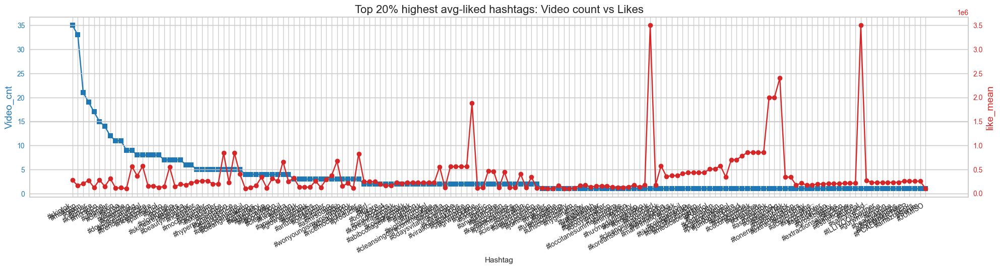

In [43]:
# 최근 6개월 좋아요 평균 상위20% 해시태그들의 사용된 영상 개수 대비 좋아요 수 + 영상 수가 적어 의미 없는 평균 제거됨

# video_cnt 기준 내림차순 정렬
top20_liked_tags_sorted = top20_liked_tags.sort_values('video_cnt', ascending=False).reset_index(drop=True)

# left side : vedio_cnt
fig, ax1 = plt.subplots(figsize=(20, 5), sharex=False)
color_1 = 'tab:blue'
ax1.set_title("Top 20% highest avg-liked hashtags: Video count vs Likes", fontsize=16)
ax1.set_xlabel('Hashtag')
ax1.set_ylabel('Video_cnt', fontsize=14, color=color_1)
ax1.plot(top20_liked_tags_sorted.tag, top20_liked_tags_sorted.video_cnt, marker='s', color=color_1)
ax1.tick_params(axis='y', labelcolor=color_1)

# right side : like_mean
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
color_2 = 'tab:red'
ax2.set_ylabel('like_mean', fontsize=14, color=color_2)
ax2.plot(top20_liked_tags_sorted.tag, top20_liked_tags_sorted.like_mean, marker='o', color=color_2)
ax2.tick_params(axis='y', labelcolor=color_2)

# Rotate x-axis labels by 45 degrees
fig.tight_layout()
plt.xticks(rotation=45)

# To make sure the x-axis labels don't overlap and fit properly
fig.autofmt_xdate()

plt.show()

In [44]:
keyword_df.columns

Index(['search_term', 'vedio_order', 'tiktoker_name', 'upload_date',
       'like_cnt', 'comment_cnt', 'save_cnt', 'info', 'hash_tag',
       'cleaned_info', 'cleaned_hash_tag', 'tokenized_info',
       'tokenized_hash_tag', 'removed_info', 'removed_hash_tag',
       'stpw_processed_info', 'stpw_processed_hash_tag', 'upload_date_str',
       'upload_y_m'],
      dtype='str')

In [45]:
tiktoker_df.columns

Index(['name', 'follower_cnt', 'upload_date', 'view_cnt', 'like_cnt',
       'comment_cnt', 'save_cnt', 'info', 'hash_tag', 'cleaned_info',
       'cleaned_hash_tag', 'tokenized_info', 'tokenized_hash_tag',
       'removed_info', 'removed_hash_tag', 'stpw_processed_info',
       'stpw_processed_hash_tag'],
      dtype='str')

# typo 주의
 micro_influancer', 'mega_influancer', 'middle_influancer','mekro_influancer', 'nano_influancer

In [46]:
# 최소 광고비용 컬럼 파생변수 생성
def min_ad_cost_range(df):
    for i in range(len(df)):
        if df['follower_cnt'][i] >= 1000000:
            df.loc[i, 'tiktoker_size'] = 'mega_influancer'
            df.loc[i, 'ad_cost'] = df['follower_cnt'][i]*20000 # 숫자로 설정
        elif df['follower_cnt'][i] >= 500000:
            df.loc[i, 'tiktoker_size'] = 'mekro_influancer'
            df.loc[i, 'ad_cost'] = df['follower_cnt'][i]*20000
        elif df['follower_cnt'][i] >= 100000:
            df.loc[i, 'tiktoker_size'] = 'middle_influancer'
            df.loc[i, 'ad_cost'] = df['follower_cnt'][i]*20000
        elif df['follower_cnt'][i] >= 10000:
            df.loc[i, 'tiktoker_size'] = 'micro_influancer'
            df.loc[i, 'ad_cost'] = df['follower_cnt'][i]*20000
        elif df['follower_cnt'][i] >= 1000:
            df.loc[i, 'tiktoker_size'] = 'nano_influancer'
            df.loc[i, 'ad_cost'] = df['follower_cnt'][i]*20000
        else:
            df.loc[i, 'tiktoker_size'] = 'under_influancer'
            df.loc[i, 'ad_cost'] = 0 
min_ad_cost_range(tiktoker_df)

In [47]:
tiktoker_df.tiktoker_size.value_counts()

tiktoker_size
middle_influancer    630
micro_influancer     600
mega_influancer      240
nano_influancer      150
mekro_influancer      60
Name: count, dtype: int64

In [48]:
temp_df = (
    keyword_df
    .merge(tiktoker_df[['name', 'tiktoker_size']],
        how='inner',
        left_on='tiktoker_name',
        right_on='name')
    .drop(columns=['name'])
)

temp_df.tiktoker_size.unique()

<ArrowStringArray>
[ 'micro_influancer',   'mega_influancer', 'middle_influancer',
  'mekro_influancer',   'nano_influancer']
Length: 5, dtype: str


=== mega_influancer ===


/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_76470/3177559821.py:66: UserWarning: Glyph 51068 (\N{HANGUL SYLLABLE IL}) missing from current font.
  fig.tight_layout()
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_76470/3177559821.py:66: UserWarning: Glyph 47532 (\N{HANGUL SYLLABLE RI}) missing from current font.
  fig.tight_layout()
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_76470/3177559821.py:66: UserWarning: Glyph 50980 (\N{HANGUL SYLLABLE YUN}) missing from current font.
  fig.tight_layout()
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 51068 (\N{HANGUL SYLLABLE IL}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 47532 (\N{HANGUL SYLLABLE RI}) missing from current font.
  fig.canvas.print_figure(bytes_

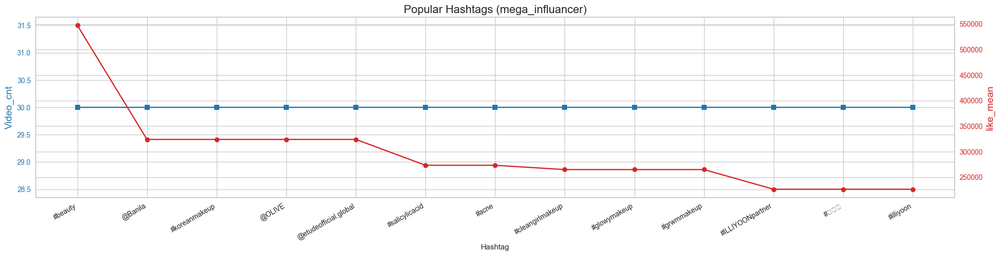


=== mekro_influancer ===


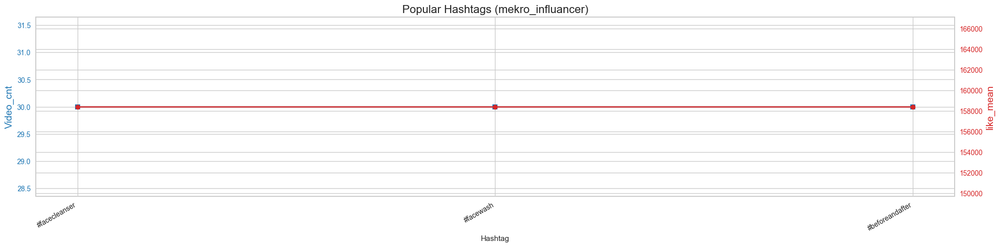


=== middle_influancer ===


/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_76470/3177559821.py:66: UserWarning: Glyph 12471 (\N{KATAKANA LETTER SI}) missing from current font.
  fig.tight_layout()
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 12471 (\N{KATAKANA LETTER SI}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


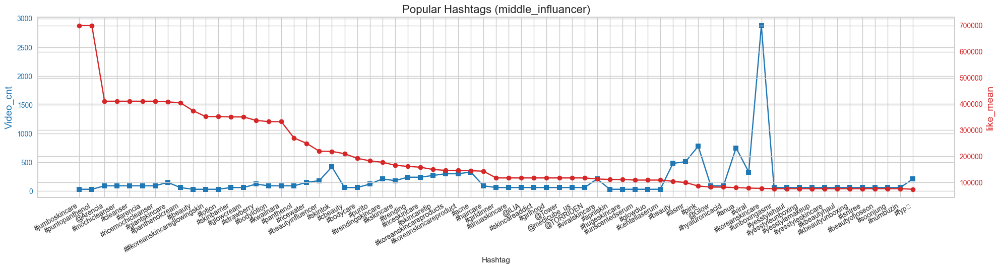


=== micro_influancer ===


/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_76470/3177559821.py:66: UserWarning: Glyph 12471 (\N{KATAKANA LETTER SI}) missing from current font.
  fig.tight_layout()
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 12471 (\N{KATAKANA LETTER SI}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


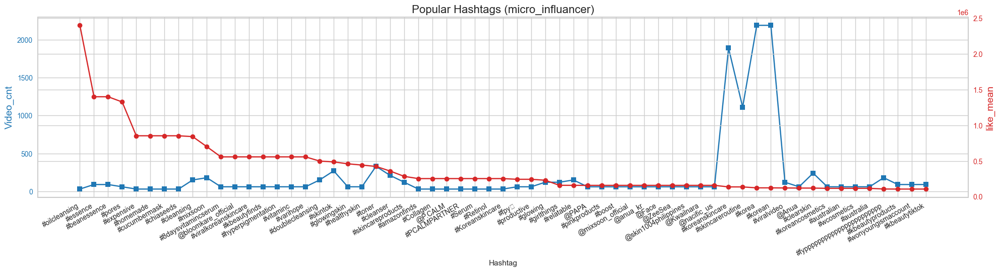


=== nano_influancer ===


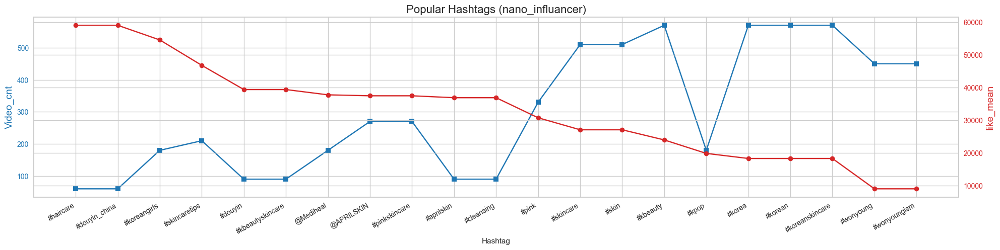

In [49]:
import pandas as pd
import matplotlib.pyplot as plt

def analyze_hashtags_by_size(keyword_df, tiktoker_df, size, recent_date='2024-06-01', min_tag_count=5, top_percent=0.2):
    """
    단일 인플루언서 사이즈별 해시태그 분석 및 시각화
    """
    # 1) 병합
    temp_df = keyword_df.merge(
        tiktoker_df[['name', 'tiktoker_size']],
        how='inner',
        left_on='tiktoker_name',
        right_on='name'
    ).drop(columns=['name'])
    
    # 2) 사이즈 필터링
    temp_df = temp_df[temp_df['tiktoker_size'] == size].copy()
    
    # 3) 최근 영상 필터링
    recent_df = temp_df[temp_df['upload_date'] >= recent_date].copy()
    recent_df['hash_tag'] = recent_df['hash_tag'].astype(str).fillna('')
    
    # 4) 해시태그 분리
    txt = ",".join(recent_df['hash_tag'])
    tag_df = pd.DataFrame(txt.split(","), columns=['tag'])
    tag_df = tag_df[tag_df['tag'].str.strip() != ""]
    
    # 5) 태그 등장 횟수 필터링
    tag_count = tag_df['tag'].value_counts().reset_index()
    tag_count.columns = ['tag', 'count']
    tag_count = tag_count[tag_count['count'] >= min_tag_count].reset_index(drop=True)
    
    # 6) 영상 수, 총 좋아요 계산
    recent_df['idx'] = recent_df.index
    tag_count['video_cnt'] = 0
    tag_count['total_like'] = 0
    for i in range(len(tag_count)):
        tag = tag_count.loc[i, 'tag']
        matched_videos = recent_df[recent_df['hash_tag'].str.contains(tag, regex=False)].copy()
        tag_count.loc[i, 'video_cnt'] = matched_videos['idx'].nunique()
        tag_count.loc[i, 'total_like'] = matched_videos.groupby('idx')['like_cnt'].first().sum()
    
    # 7) 평균 좋아요
    tag_count['like_mean'] = tag_count['total_like'] / tag_count['video_cnt']
    
    # 8) 상위 n% 태그만 필터링
    n_tags = max(1, int(len(tag_count) * top_percent))
    temp = tag_count.sort_values('like_mean', ascending=False).head(n_tags).reset_index(drop=True)
    
    # 9) 시각화
    fig, ax1 = plt.subplots(figsize=(20,5))
    color_1 = 'tab:blue'
    ax1.set_title(f'Popular Hashtags ({size})', fontsize=16)
    ax1.set_xlabel('Hashtag')
    ax1.set_ylabel('Video_cnt', fontsize=14, color=color_1)
    ax1.plot(temp.tag, temp.video_cnt, marker='s', color=color_1)
    ax1.tick_params(axis='y', labelcolor=color_1)

    ax2 = ax1.twinx()
    color_2 = 'tab:red'
    ax2.set_ylabel('like_mean', fontsize=14, color=color_2)
    ax2.plot(temp.tag, temp.like_mean, marker='o', color=color_2)
    ax2.tick_params(axis='y', labelcolor=color_2)
    
    plt.xticks(rotation=45)
    fig.tight_layout()
    fig.autofmt_xdate()
    plt.show()
    
    return tag_count

# 각 사이즈별 분석 반복
sizes = ['mega_influancer','mekro_influancer',  'middle_influancer', 'micro_influancer','nano_influancer']

size_tag_counts = {}
for sz in sizes:
    print(f"\n=== {sz} ===")
    size_tag_counts[sz] = analyze_hashtags_by_size(
        keyword_df, tiktoker_df, 
        size=sz, recent_date='2024-06-01',
        min_tag_count=5,
        top_percent=0.2
    )


In [50]:
keyword_df.columns

Index(['search_term', 'vedio_order', 'tiktoker_name', 'upload_date',
       'like_cnt', 'comment_cnt', 'save_cnt', 'info', 'hash_tag',
       'cleaned_info', 'cleaned_hash_tag', 'tokenized_info',
       'tokenized_hash_tag', 'removed_info', 'removed_hash_tag',
       'stpw_processed_info', 'stpw_processed_hash_tag', 'upload_date_str',
       'upload_y_m'],
      dtype='str')

#### 2. tiktoker_df

##### 2-1. 인플루언서 사이즈 구분 및 광고 단가 추정치
- 나노 인플루언서 (1,000–10,000 팔로워): 게시물당 $5~$25
- 마이크로 인플루언서 (10,000–100,000 팔로워): 게시물당 $25~$125
- 중간급 인플루언서 (100,000–500,000 팔로워): 게시물당 $125~$1,200
- 매크로 인플루언서 (500,000–1백만 팔로워): 게시물당 $1,200~$2,500
- 메가 인플루언서 (1백만+ 팔로워): 게시물당 $2,500 이상

##### 2-2. 평균 업로드 주기 계산(파생변수 생성)

In [51]:
import pandas as pd
import numpy as np
import re
from datetime import datetime, timedelta

# ✅ 현재 날짜 기준
TODAY = datetime(2025, 1, 27)  # 현재 날짜 설정

# ✅ 'date' 열을 변환하는 함수 (에러 방지 추가)
def parse_date(date_str):
    date_str = str(date_str).strip().lower()  # 공백 제거, 소문자 변환

    # 1️⃣ MM-DD 형식 변환 (예: "1-14" → 2025-01-14)
    match_mmdd = re.fullmatch(r"(\d{1,2})-(\d{1,2})", date_str)
    if match_mmdd:
        month, day = map(int, match_mmdd.groups())  # 월, 일 추출
        return datetime(2025, month, day)  # 2025년으로 변환

    # 2️⃣ 숫자 + 단위(h, d, w) 변환 (예: "14h", "3d", "2w")
    match_relative = re.fullmatch(r"(\d+)([hdw])(?:\s*ago)?", date_str)  # " ago" 처리 추가
    if match_relative:
        num, unit = int(match_relative.group(1)), match_relative.group(2)  # 숫자, 단위 분리
        
        if unit == "h":  # 시간 단위
            return TODAY - timedelta(hours=num)
        elif unit == "d":  # 일 단위
            return TODAY - timedelta(days=num)
        elif unit == "w":  # 주 단위 (1주 = 7일)
            return TODAY - timedelta(weeks=num)

    # 3️⃣ 날짜 형식(YYYY-MM-DD) 변환
    try:
        return pd.to_datetime(date_str)  # YYYY-MM-DD 형식 변환
    except Exception as e:
        print(f"Failed to parse date: {date_str}. Error: {e}")
        return np.nan  # 변환 실패 시 NaT 반환

# ✅ 'date' 열 변환
tiktoker_df["upload_date"] = tiktoker_df["upload_date"].apply(parse_date)

# ✅ name 별로 업로드 간격 계산
tiktoker_df = tiktoker_df.sort_values(by=["name", "upload_date"])  # 이름 + 날짜순 정렬
tiktoker_df["prev_date"] = tiktoker_df.groupby("name")["upload_date"].shift(1)  # 이전 영상 날짜
tiktoker_df["upload_gap"] = (tiktoker_df["upload_date"] - tiktoker_df["prev_date"]).dt.days  # 간격(일)

# ✅ 평균 업로드 주기 계산
upload_cycle = tiktoker_df.groupby("name")["upload_gap"].mean().reset_index()
upload_cycle.rename(columns={"upload_gap": "avg_upload_interval"}, inplace=True)

# ✅ 결과 출력
print(upload_cycle)

                 name  avg_upload_interval
0       .blissdiaries                 4.07
1             .m.egan                 5.03
2            .woniluv                 2.38
3           4chriisty                 2.48
4          __.annie.s                 3.14
5         _luvwonsnnx                 1.48
6          aeiezo.pdf                 3.48
7     ameenbeautytips                 0.17
8           amyflamy1                 1.45
9           asiamelon                 3.34
10           ayheyt3u                 5.76
11         aylennpark                 1.62
12         bwnniewony                 1.93
13   caspertheghostyy                 0.83
14     cleangirlhacks                 3.03
15   cleanlivingkarly                 0.55
16         danicolexx                 0.31
17         dearwonii_                 2.66
18             emchu_                 3.41
19          fromh1ae_                 2.21
20            gae4hrv                 3.59
21     glowupwithinah                 0.24
22         

In [52]:
tiktoker_df[ tiktoker_df.name == "dearwonii_"]

,name,follower_cnt,upload_date,view_cnt,like_cnt,comment_cnt,save_cnt,info,hash_tag,cleaned_info,...,tokenized_info,tokenized_hash_tag,removed_info,removed_hash_tag,stpw_processed_info,stpw_processed_hash_tag,tiktoker_size,ad_cost,prev_date,upload_gap
329,dearwonii_,217100.00,2024-11-04,534100,11900,251,2198,Your sign to literally exfoliate! Exfoliating ...,"#tonerpad,#exfoliate,#pores,##skincare,#kbeaut...",your sign to literally exfoliate exfoliating c...,...,"[your, sign, to, literally, exfoliate, exfolia...",[tonerpadexfoliateporesskincarekbeautybeautyto...,"[sign, literally, exfoliate, exfoliating, help...",[tonerpadexfoliateporesskincarekbeautybeautyto...,"[sign, liter, exfoli, exfoli, help, remov, pre...",[tonerpadexfoliateporesskincarekbeautybeautyto...,middle_influancer,4342000000.00,NaT,NaN
328,dearwonii_,217100.00,2024-11-07,109300,13400,430,1772,One of my favorite beauty supplements! 2 jars ...,"#beautysupplement,#beauty,#glasskin,#fyp,#fypシ...",one of my favorite beauty supplements 2 jars d...,...,"[one, of, my, favorite, beauty, supplements, 2...",[beautysupplementbeautyglasskinfypfypシtargetau...,"[one, favorite, supplements, 2, jars, down🤭sof...",[beautysupplementbeautyglasskinfypfypシtargetau...,"[one, favorit, supplement, 2, jar, down🤭softgl...",[beautysupplementbeautyglasskinfypfypシtargetaudi],middle_influancer,4342000000.00,2024-11-04,3.00
327,dearwonii_,217100.00,2024-11-14,62500,4295,219,522,the cream I only trust with my sensitive skin!...,"@일리윤,#illiyoon,#skincare,#kbeauty,#amazonfinds...",the cream i only trust with my sensitive skin ...,...,"[the, cream, i, only, trust, with, my, sensiti...",[illiyoonskincarekbeautyamazonfindssensitivesk...,"[cream, trust, sensitive, loving, cream, latel...",[illiyoonskincarekbeautyamazonfindssensitivesk...,"[cream, trust, sensit, love, cream, late, real...",[illiyoonskincarekbeautyamazonfindssensitivesk...,middle_influancer,4342000000.00,2024-11-07,7.00
326,dearwonii_,217100.00,2024-11-16,2000000,42300,450,3673,Everything in my skincare that I use in order ...,"#TikTokSuperBrandDay,#skincareroutine,#skin100...",everything in my skincare that i use in order ...,...,"[everything, in, my, skincare, that, i, use, i...",[tiktoksuperbranddayskincareroutineskin1004kbe...,"[everything, use, order, achieve, glowy, clear...",[tiktoksuperbranddayskincareroutineskin1004kbe...,"[everyth, use, order, achiev, glowi, clear, en...",[tiktoksuperbranddayskincareroutineskin1004kbe...,middle_influancer,4342000000.00,2024-11-14,2.00
325,dearwonii_,217100.00,2024-11-18,58700,4491,178,609,noni fruit is all my skin needs! Definitely my...,"#ampoule,#nonifruit,#skincare,#kbeauty,#beauty...",noni fruit is all my skin needs definitely my ...,...,"[noni, fruit, is, all, my, skin, needs, defini...",[ampoulenonifruitskincarekbeautybeautyfypシfypt...,"[noni, fruit, needs, definitely, savior, ampou...",[ampoulenonifruitskincarekbeautybeautyfypシfypt...,"[noni, fruit, need, definit, savior, ampoulece...",[ampoulenonifruitskincarekbeautybeautyfypシfypt...,middle_influancer,4342000000.00,2024-11-16,2.00
324,dearwonii_,217100.00,2024-11-21,71800,4434,197,521,If the popular COSRX snail mucin essence didn’...,"#ksecret,#skincare,#kbeauty,#beauty,#fypシ,#fyp...",if the popular cosrx snail mucin essence didn’...,...,"[if, the, popular, cosrx, snail, mucin, essenc...",[ksecretskincarekbeautybeautyfypシfyptargetaudi...,"[popular, cosrx, snail, mucin, essence, ’, wor...",[ksecretskincarekbeautybeautyfypシfyptargetaudi...,"[popular, cosrx, snail, mucin, essenc, ’, work...",[ksecretskincarekbeautybeautyfypシfyptargetaudi],middle_influancer,4342000000.00,2024-11-18,3.00
323,dearwonii_,217100.00,2024-11-22,75100,8024,358,918,grwm for a holiday!(winter edition❄️)#grwm #ma...,"#makeup,#winter,#beauty,#beautytok,#fypシ,#fyp,...",grwm for a holidaywinter edition❄️grwm makeup ...,...,"[grwm, for, a, holidaywinter, edition❄️grwm, m...",[makeupwinterbeautybeautytokfypシfyptargetaudie...,"[grwm, holidaywinter, edition❄️grwm, makeup,

In [53]:
# 1차 차분
tiktoker_df["upload_gap_diff"] = tiktoker_df.groupby("name")["upload_gap"].diff()
#그룹별 평균 변화량 한 번에 적용
tiktoker_df["avg_upload_gap_change"] = tiktoker_df.groupby("name")["upload_gap_diff"].transform("mean")


In [54]:
tiktoker_df.groupby('name')['upload_gap'].mean()

name
.blissdiaries        4.07
.m.egan              5.03
.woniluv             2.38
4chriisty            2.48
__.annie.s           3.14
_luvwonsnnx          1.48
aeiezo.pdf           3.48
ameenbeautytips      0.17
amyflamy1            1.45
asiamelon            3.34
ayheyt3u             5.76
aylennpark           1.62
bwnniewony           1.93
caspertheghostyy     0.83
cleangirlhacks       3.03
cleanlivingkarly     0.55
danicolexx           0.31
dearwonii_           2.66
emchu_               3.41
fromh1ae_            2.21
gae4hrv              3.59
glowupwithinah       0.24
haruqhxz             5.62
heartsfor.kbeauty    2.59
its.kaylas           1.31
itsedonna            1.31
izzydiaries          3.38
jaerini              9.14
jasminnlily_         2.24
jeb_bi               1.86
koocat               1.72
krystallee2222       2.24
kwyeona              2.31
lovelymiri05         0.62
luvsfor.jennie       1.21
milkydew             0.52
minseonk1m           0.83
misscasxie           4.48
monakoa

##### 2-3. 업로드 일자 확인

In [55]:
def upload_y_m(df):
    df['upload_date_str'] = df['upload_date'].astype(str)
    for i in range(len(df)):
        date = df['upload_date_str'][i]
        y_m = date[:7]
        df.loc[i,'upload_y_m'] = y_m

upload_y_m(tiktoker_df)

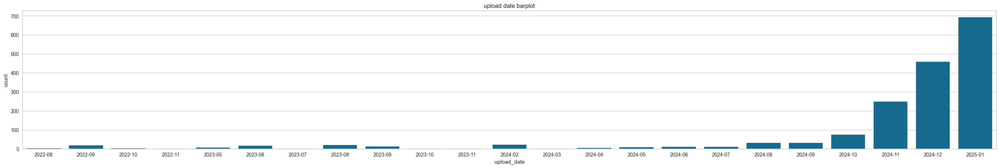

In [56]:
date_groupby = tiktoker_df.groupby('upload_y_m')['name'].count().reset_index()

fig, axes = plt.subplots(figsize=(35, 5), sharex=False)
sns.barplot(x='upload_y_m', y='name', data=date_groupby)
plt.title('upload date barplot')
plt.xlabel('upload_date')
plt.ylabel('count')
plt.show()

##### 2-4. 인플루언서별 정량적 지표 구하기

In [57]:
tiktoker_df.count()

name                       1680
follower_cnt               1680
upload_date                1680
view_cnt                   1680
like_cnt                   1680
comment_cnt                1680
save_cnt                   1680
info                       1664
hash_tag                   1620
cleaned_info               1664
cleaned_hash_tag           1620
tokenized_info             1664
tokenized_hash_tag         1620
removed_info               1664
removed_hash_tag           1620
stpw_processed_info        1664
stpw_processed_hash_tag    1620
tiktoker_size              1680
ad_cost                    1680
prev_date                  1624
upload_gap                 1624
upload_gap_diff            1568
avg_upload_gap_change      1680
upload_date_str            1680
upload_y_m                 1680
dtype: int64

In [58]:
len(tiktoker_df.name.unique())

56

In [59]:
# 인플루언서 선정은 ‘사람(계정)’ 단위로 이루어진다 그러므로 계정 전체의 평균 성과(Mean Engagement)를 보는 것이 자연스럽다

mean_df = tiktoker_df.groupby('name').agg({'follower_cnt':'mean',
                                    'view_cnt':'mean',
                                    'like_cnt':'mean',
                                    'comment_cnt':'mean',
                                    'save_cnt':'mean',
                                    'upload_gap':'mean',
                                    'tiktoker_size': 'max',
                                    'ad_cost':"mean"
                                    }).reset_index()
mean_df.head(3)

,name,follower_cnt,view_cnt,like_cnt,comment_cnt,save_cnt,upload_gap,tiktoker_size,ad_cost
0,.blissdiaries,81700.00,9717.97,1447.33,60.47,196.20,4.07,micro_influancer,1634000000.00
1,.m.egan,238200.00,178070.00,23864.30,182.53,3527.30,5.03,middle_influancer,4764000000.00
2,.woniluv,135600.00,41956.20,2399.00,85.77,369.93,2.38,middle_influancer,2712000000.00


In [60]:
mean_df.count()

name             56
follower_cnt     56
view_cnt         56
like_cnt         56
comment_cnt      56
save_cnt         56
upload_gap       56
tiktoker_size    56
ad_cost          56
dtype: int64

In [61]:
min_ad_cost_range(mean_df)
mean_df.head(3)

,name,follower_cnt,view_cnt,like_cnt,comment_cnt,save_cnt,upload_gap,tiktoker_size,ad_cost
0,.blissdiaries,81700.00,9717.97,1447.33,60.47,196.20,4.07,micro_influancer,1634000000.00
1,.m.egan,238200.00,178070.00,23864.30,182.53,3527.30,5.03,middle_influancer,4764000000.00
2,.woniluv,135600.00,41956.20,2399.00,85.77,369.93,2.38,middle_influancer,2712000000.00


In [62]:
# ER 구하기
# ER : ((좋아요 수 + 댓글 수) / 팔로워 수) * 100
mean_df['ER'] = ((mean_df['like_cnt']+mean_df['comment_cnt'])/mean_df['follower_cnt'])*100


# ERV 구하기
# ERV : ((좋아요 수 + 댓글 수 + 저장 수) / 조회수) * 100
mean_df['ERV'] = (mean_df['like_cnt'] + mean_df['comment_cnt'] + mean_df['save_cnt']) / mean_df['view_cnt'] * 100
mean_df.head(3)

,name,follower_cnt,view_cnt,like_cnt,comment_cnt,save_cnt,upload_gap,tiktoker_size,ad_cost,ER,ERV
0,.blissdiaries,81700.00,9717.97,1447.33,60.47,196.20,4.07,micro_influancer,1634000000.00,1.85,17.53
1,.m.egan,238200.00,178070.00,23864.30,182.53,3527.30,5.03,middle_influancer,4764000000.00,10.10,15.48
2,.woniluv,135600.00,41956.20,2399.00,85.77,369.93,2.38,middle_influancer,2712000000.00,1.83,6.80


In [63]:
cols = ["follower_cnt", "view_cnt", "like_cnt", "comment_cnt", "save_cnt", "ER", "ERV"]

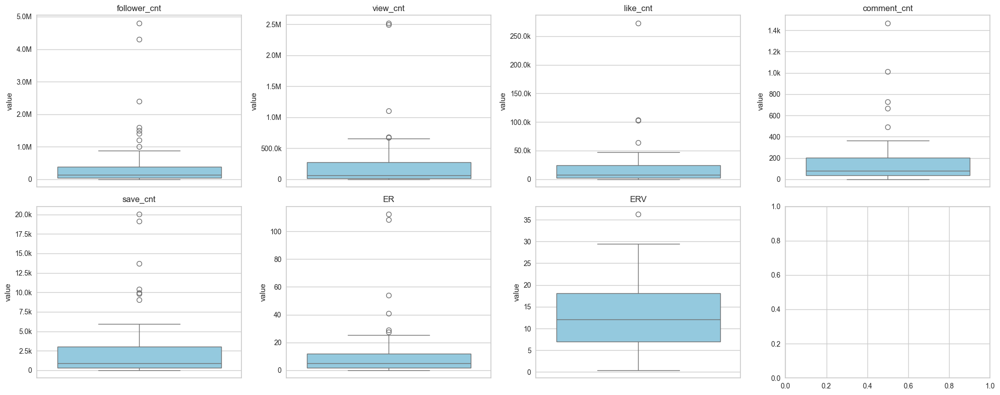

In [64]:
import matplotlib.ticker as mtick

def human_format(x, pos):
    if x >= 1e6:
        return f'{x*1e-6:.1f}M'
    elif x >= 1e3:
        return f'{x*1e-3:.1f}k'
    else:
        return f'{x:.0f}'

formatter = mtick.FuncFormatter(human_format)


fig, axes = plt.subplots(2, 4, figsize=(20, 8))

for ax, col in zip(axes.flatten(), cols):
    sns.boxplot(y=mean_df[col], ax=ax, color='skyblue')  # 색상 추가
    ax.set_title(col)
    ax.set_ylabel("value")
    ax.yaxis.set_major_formatter(formatter)

plt.tight_layout()
plt.show()

In [65]:
summary_stats = {}

for col in cols :
    summary_stats[col] = {
    "count": mean_df[col].count(),
    "mean": mean_df[col].mean(),
    "median": mean_df[col].median(),
    "std": mean_df[col].std(),
    "min": mean_df[col].min(),
    "max": mean_df[col].max()
    }

summary_df = pd.DataFrame(summary_stats).T
summary_df


,count,mean,median,std,min,max
follower_cnt,56.00,470629.54,142600.00,924280.71,4121.00,4800000.00
view_cnt,56.00,246204.17,59798.30,489895.19,1690.83,2518470.00
like_cnt,56.00,20198.40,7734.62,41024.61,73.27,272720.00
comment_cnt,56.00,174.63,80.58,260.20,0.50,1466.93
save_cnt,56.00,2836.41,920.40,4444.31,0.67,20036.77
ER,56.00,12.00,5.14,21.73,0.03,112.37
ERV,56.00,13.81,12.10,8.02,0.42,36.27


In [66]:
# 아웃라이어를 IQR 방식으로 확인
outlier_info = {}

for col in cols:
    Q1 = mean_df[col].quantile(0.25)
    Q3 = mean_df[col].quantile(0.75)
    IQR = Q3 - Q1
    outliers = mean_df[(mean_df[col] < Q1 - 1.5*IQR) | (mean_df[col] > Q3 + 1.5*IQR)]
    outlier_info[col] = {
        "outlier_count": len(outliers),
        "outlier_ratio": len(outliers)/len(mean_df)
    }

outlier_df = pd.DataFrame(outlier_info).T
print(outlier_df)

              outlier_count  outlier_ratio
follower_cnt           8.00           0.14
view_cnt               5.00           0.09
like_cnt               4.00           0.07
comment_cnt            5.00           0.09
save_cnt               7.00           0.12
ER                     6.00           0.11
ERV                    1.00           0.02


In [67]:
def remove_outlier_rows(df, cols):
    filtered_df = df.copy()
    for col in cols:
        Q1 = filtered_df[col].quantile(0.25)
        Q3 = filtered_df[col].quantile(0.75)
        IQR = Q3 - Q1
        # 한 컬럼이라도 아웃라이어면 제거
        filtered_df = filtered_df[(filtered_df[col] >= Q1 - 1.5*IQR) & (filtered_df[col] <= Q3 + 1.5*IQR)]
    return filtered_df

# 적용
filtered_df = remove_outlier_rows(mean_df, cols)

# 요약 통계 계산
summary_stats = {col: {
    "count": filtered_df[col].count(),
    "mean": filtered_df[col].mean(),
    "median": filtered_df[col].median(),
    "std": filtered_df[col].std(),
    "min": filtered_df[col].min(),
    "max": filtered_df[col].max()
} for col in cols}

summary_df = pd.DataFrame(summary_stats).T.round(2)
summary_df

,count,mean,median,std,min,max
follower_cnt,26.00,149388.46,79200.00,157452.04,13700.00,504500.00
view_cnt,26.00,37231.21,22648.40,39445.00,1690.83,157372.27
like_cnt,26.00,3299.07,2389.07,2843.38,73.27,9439.93
comment_cnt,26.00,61.35,46.02,56.00,0.50,222.23
save_cnt,26.00,528.47,377.65,431.11,0.67,1829.90
ER,26.00,3.73,2.12,3.64,0.05,14.39
ERV,26.00,13.75,14.33,7.72,3.62,28.73


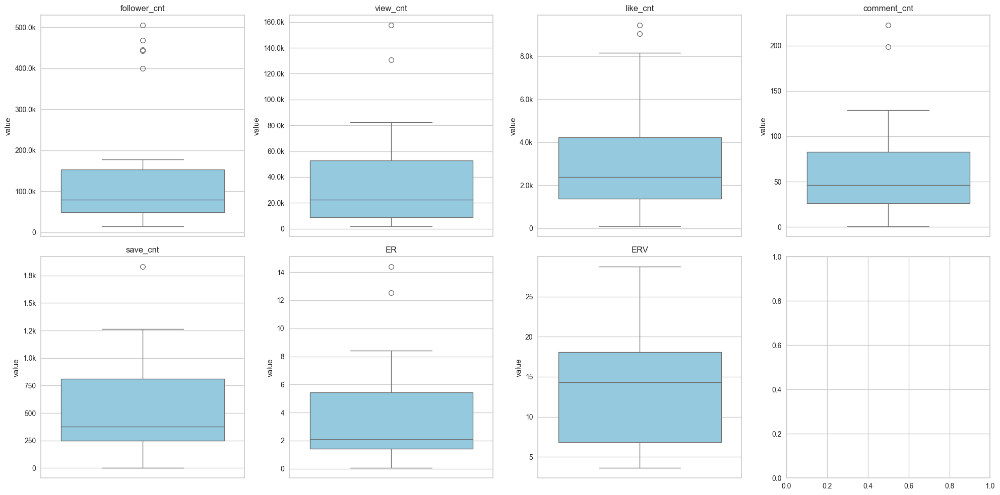

In [68]:
fig, axes = plt.subplots(2, 4, figsize=(20, 10))

for ax, col in zip(axes.flatten(), cols):
    sns.boxplot(y=filtered_df[col], ax=ax, color='skyblue')
    ax.set_title(col)
    ax.set_ylabel("value")
    ax.yaxis.set_major_formatter(formatter)

plt.tight_layout()
plt.show()


In [69]:
mean_df.tiktoker_size.unique()

<ArrowStringArray>
[ 'micro_influancer', 'middle_influancer',   'mega_influancer',
  'mekro_influancer',   'nano_influancer']
Length: 5, dtype: str

In [70]:
size_counts = mean_df.groupby('tiktoker_size')[cols[0]].count()  # cols[0] 아무 컬럼 하나 선택해도 됨
size_counts = size_counts.reset_index().rename(columns={cols[0]: 'count'})
print(size_counts)

       tiktoker_size  count
0    mega_influancer      8
1   mekro_influancer      2
2   micro_influancer     20
3  middle_influancer     21
4    nano_influancer      5


In [71]:
cols

['follower_cnt',
 'view_cnt',
 'like_cnt',
 'comment_cnt',
 'save_cnt',
 'ER',
 'ERV']

/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_76470/203892770.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_76470/203892770.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_76470/203892770.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_76470/203892770.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will 

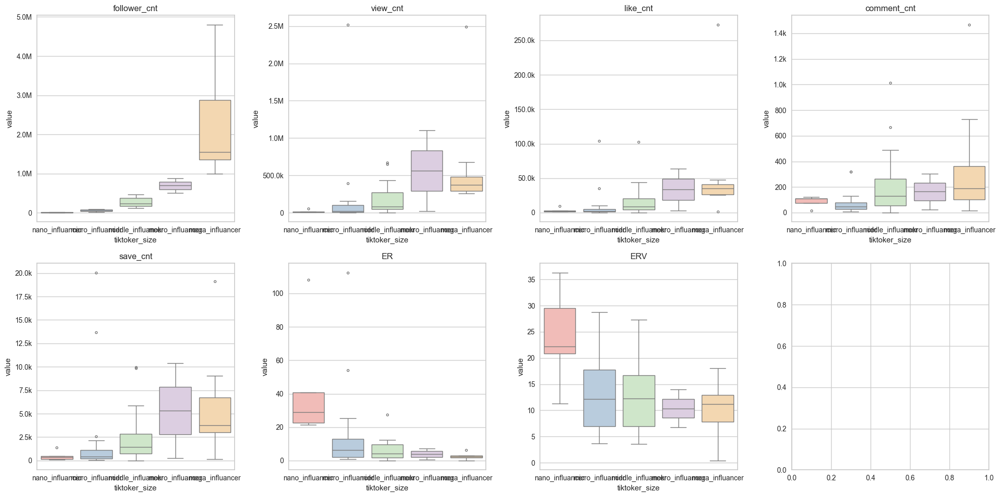

In [72]:
size_order = ['nano_influancer', 'micro_influancer', 'middle_influancer', 'mekro_influancer', 'mega_influancer']

# 박스플롯 시각화
fig, axes = plt.subplots(2,4, figsize=(20, 10))
for ax, col in zip(axes.flatten(), cols):
    sns.boxplot(
        x='tiktoker_size',
        y=col,
        data=mean_df,
        ax=ax,
        palette='Pastel1',
        order=size_order,  # 원하는 순서
        fliersize=3
    )
    ax.set_title(col)
    ax.set_ylabel("value")
    ax.yaxis.set_major_formatter(formatter)
plt.tight_layout()
plt.show()


In [73]:
size_order.reverse()

In [74]:
size_order

['mega_influancer',
 'mekro_influancer',
 'middle_influancer',
 'micro_influancer',
 'nano_influancer']

In [75]:
mean_df.columns

Index(['name', 'follower_cnt', 'view_cnt', 'like_cnt', 'comment_cnt',
       'save_cnt', 'upload_gap', 'tiktoker_size', 'ad_cost', 'ER', 'ERV'],
      dtype='str')

✅ 현재 폰트 적용됨: Arial Unicode MS


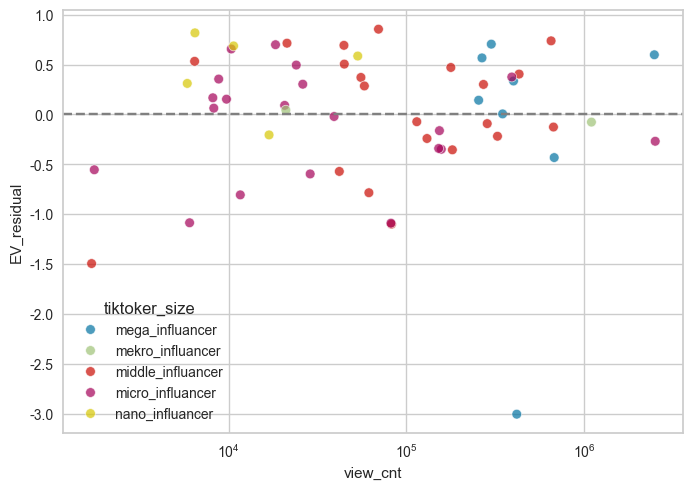

In [76]:
import statsmodels.api as sm
import pltfont
pltfont.auto()

mean_df['EV'] = (
    mean_df['like_cnt']
    + mean_df['comment_cnt']
    + mean_df['save_cnt']
)

X = sm.add_constant(np.log(mean_df['view_cnt']))
y = np.log(mean_df['EV'])

model = sm.OLS(y, X).fit()
mean_df['EV_residual'] = model.resid

sns.scatterplot(
    data=mean_df,
    x='view_cnt',
    y='EV_residual',
    hue='tiktoker_size',
    alpha=0.7,
    hue_order=size_order
)
plt.xscale('log')
plt.axhline(0, color='gray', linestyle='--')

/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_76470/2276148532.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


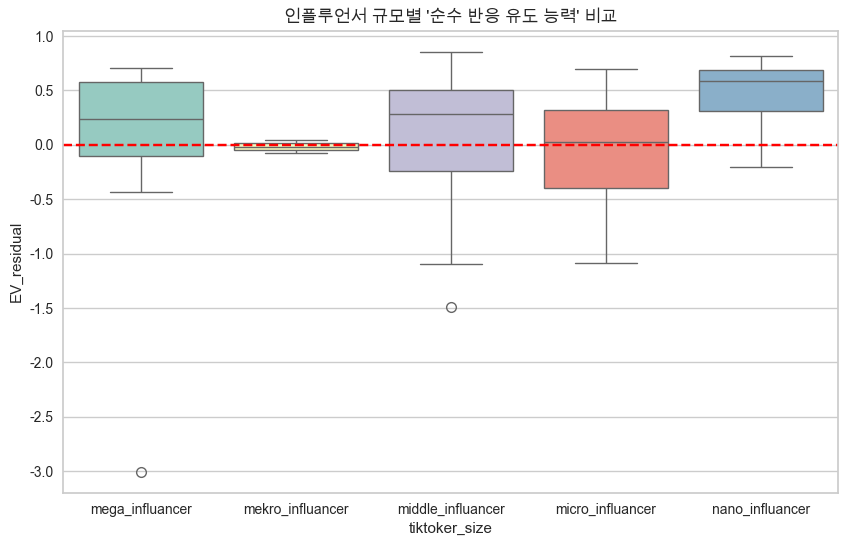

In [77]:
plt.figure(figsize=(10, 6))
sns.boxplot(
    data=mean_df,
    x='tiktoker_size',
    y='EV_residual',
    order=size_order,
    palette='Set3'
)
plt.axhline(0, color='red', linestyle='--')
plt.title("인플루언서 규모별 '순수 반응 유도 능력' 비교")
plt.show()

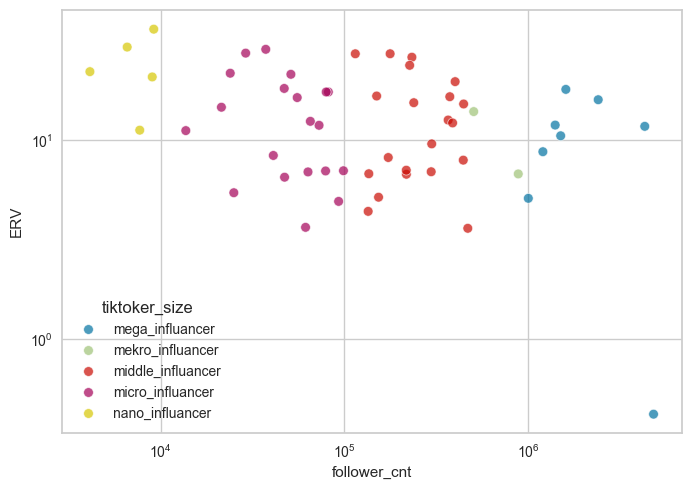

In [78]:
sns.scatterplot(
    data=mean_df,
    x='follower_cnt',
    y='ERV',
    hue='tiktoker_size',
    alpha=0.7,
    hue_order=size_order
)
plt.xscale('log')  # 규모 차이가 크면 로그 스케일 추천
plt.yscale('log')

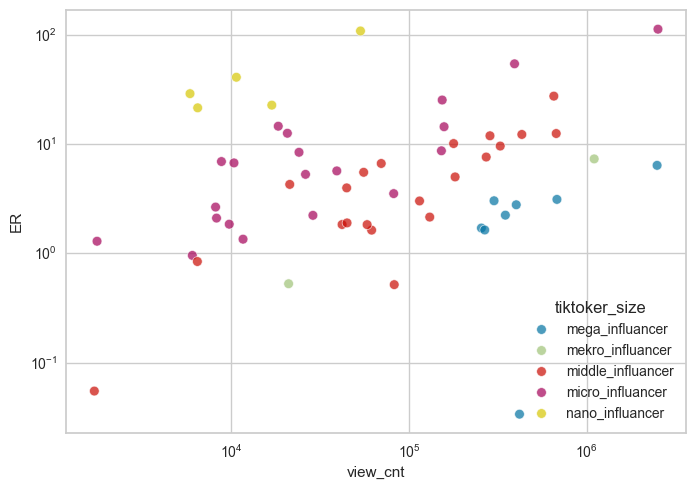

In [79]:
sns.scatterplot(
    data=mean_df,
    x='view_cnt',
    y='ER',
    hue='tiktoker_size',
    alpha=0.7,
    hue_order=size_order
)
plt.xscale('log')  # 규모 차이가 크면 로그 스케일 추천
plt.yscale('log')

---

### 마케팅 비용으로 환산해보자.


### K-Beauty 콘텐츠 정체성 프리미엄 분석 (Notebook)
**목적**: TikTok 스킨케어 콘텐츠를 대상으로 K-beauty 해시태그 사용이 조회수 대비 참여율(ERV)에 미치는 구조적 효과를 탐색하고,
회귀·매칭(PSM)·AutoML 결과를 바탕으로 1만 뷰당 정량적 마케팅 가치를 산정한다.

**구성**
1. 데이터 로드 및 그룹 정의
2. EDA (분포, 그룹별 비교, 비모수 검정)
3. 회귀분석: 3-그룹 구조(Others / Generic / K-beauty)
4. 인과보강: Propensity Score Matching (PSM)
5. AutoML / PyCaret 실험 (비교 & 삽질 기록)
6. 가치환산 및 리포트



In [80]:
tiktoker_df.columns

Index(['name', 'follower_cnt', 'upload_date', 'view_cnt', 'like_cnt',
       'comment_cnt', 'save_cnt', 'info', 'hash_tag', 'cleaned_info',
       'cleaned_hash_tag', 'tokenized_info', 'tokenized_hash_tag',
       'removed_info', 'removed_hash_tag', 'stpw_processed_info',
       'stpw_processed_hash_tag', 'tiktoker_size', 'ad_cost', 'prev_date',
       'upload_gap', 'upload_gap_diff', 'avg_upload_gap_change',
       'upload_date_str', 'upload_y_m'],
      dtype='str')

1️⃣ 라이브러리 & 환경 설정

Cell 1 — 라이브러리 임포트 (Code)

In [81]:
# 기본
import os
import pandas as pd
import numpy as np

# 시각화
import matplotlib.pyplot as plt
import seaborn as sns
import pltfont
sns.set(style="whitegrid")

# 통계 / 회귀
import statsmodels.formula.api as smf
from scipy.stats import kruskal, mannwhitneyu, shapiro, levene
from statsmodels.stats.weightstats import ttest_ind

# PSM / 매칭
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import NearestNeighbors

# AutoML / PyCaret (의존성 때문에 환경 이슈 있을 수 있음 — 아래 NOTE 참조)
# PyCaret 사용은 주석으로 두고 필요시 켤 수 있도록 함
# from pycaret.regression import setup, compare_models, pull

# AutoGluon 불러오기 (권장: 이미 학습된 모델 로드만 사용)
# from autogluon.tabular import TabularPredictor

# 유틸
import math
from IPython.display import display

Cell 2 — 데이터 로드 / 복사 (Code)

In [82]:
# ------------------------------
# 데이터 로드
# ------------------------------
# 이미 전처리된 tiktoker_df가 메모리에 있다고 가정
# (본 노트북은 '분석' 전용)

assert 'tiktoker_df' in globals(), "tiktoker_df가 로드되어 있지 않음"

tmp_df = tiktoker_df.copy()
print("총 샘플 수:", len(tmp_df))
display(tmp_df.head())


총 샘플 수: 1680


,name,follower_cnt,upload_date,view_cnt,like_cnt,comment_cnt,save_cnt,info,hash_tag,cleaned_info,...,stpw_processed_info,stpw_processed_hash_tag,tiktoker_size,ad_cost,prev_date,upload_gap,upload_gap_diff,avg_upload_gap_change,upload_date_str,upload_y_m
299,.blissdiaries,81700.00,2024-09-23,9209,807,48,92,I recieved this product for free from picky an...,"@Picky,@Picky,@numbuzin,#foryou,#pickyreview,#...",i recieved this product for free from picky an...,...,"[reciev, free, picki, numbuzin, exchang, hones...",[foryoupickyreviewgopickypickyxnumbuzinnumbuzi...,micro_influancer,1634000000.00,NaT,NaN,NaN,-0.11,2024-09-23,2024-09
298,.blissdiaries,81700.00,2024-09-27,8462,923,46,116,I recieved this product for free from picky an...,"@Picky,@Picky,@Dr.G,#foryou,#pickyreview,#gopi...",i recieved this product for free from picky an...,...,"[reciev, free, picki, drg, exchang, honest, re...",[gforyoupickyreviewgopickypickyxdrgdrgkbeautyw...,micro_influancer,1634000000.00,2024-09-23,4.00,NaN,-0.11,2024-09-27,2024-09
295,.blissdiaries,81700.00,2024-09-28,16300,2106,62,298,yesstyle perfect lips mix & match- swatches 🎀🩰...,"@YesStyleInfluencers,#fyp,#foryou,#yesstyle,#y...",yesstyle perfect lips mix match swatches 🎀🩰 u...,...,"[yesstyl, perfect, lip, mix, match, swatch, 🎀🩰...",[fypforyouyesstyleyesstyleinfluencersyesstyleb...,micro_influancer,1634000000.00,2024-09-27,1.00,-3.00,-0.11,2024-09-28,2024-09
296,.blissdiaries,81700.00,2024-09-28,16600,2550,71,321,i cant help it okay 💔💔 use yesstyle rewards co...,"#fyp,#foryou,#yesstyle,#lippies,#wonyoungism,#...",i cant help it okay 💔💔 use yesstyle rewards co...,...,"[cant, help, okay, 💔💔, use, yesstyl, reward, c...",[fypforyouyesstylelippieswonyoungismwonyounggi...,micro_influancer,1634000000.00,2024-09-28,0.00,-1.00,-0.11,2024-09-28,2024-09
297,.blissdiaries,81700.00,2024-09-28,15700,2456,73,454,yesstyle perfect lips - mix & match 🐰🎀 the cut...,"@YesStyle,@YesStyleInfluencers,#fyp,#foryou,#y...",yesstyle perfect lips mix match 🐰🎀 the cutes...,...,"[yesstyl, perfect, lip, mix, match, 🐰🎀, cutest...",[fypforyouyesstyleyesstyleinfluencersyesstyleb...,micro_influancer,1634000000.00,2024-09-28,0.00,0.00,-0.11,2024-09-28,2024-09


Cell 3 — 그룹 정의 (Code + Comment)

In [83]:
# ------------------------------
# 콘텐츠 그룹 정의
# ------------------------------
# 목적:
# - '스킨케어'라는 카테고리 효과와
# - 'K-beauty 정체성' 효과를 분리하기 위함


# (사용 전 이미 group이 없다면 아래 classifier를 실행)
k_keyword = ["kbeauty", "k-beauty", "koreanskincare"]
non_k_skincare = ["skincare", "skincareroutine", "glassskin", "skintok"]

def group_classifier(x):
    x = str(x).lower()
    if any(k in x for k in k_keyword):
        return "k_keyword"
    elif any(k in x for k in non_k_skincare):
        return "non_k_skincare_only"
    else:
        return "others"

tmp_df["group"] = tmp_df["hash_tag"].apply(group_classifier)

display(tmp_df["group"].value_counts())


group
k_keyword              809
others                 677
non_k_skincare_only    194
Name: count, dtype: int64

Cell 4 — 지표 생성, 분모/극단값 처리, 기본 전처리

설명(짧게): tmp_df를 안전하게 검사하고(숫자형 강제), engagements(성공 수)를 만들고, follower_cnt/view_cnt의 0 처리, 로그파생, view_to_follower_ratio 안전 계산, 소수 view 필터링(기본: 20) 및 ERV 상위 99% 윈저라이즈를 한 뒤 요약과 head()를 출력한다.

In [84]:
# ----------------------------
# Cell 4 — 지표 생성 및 결측/극단값 처리 (수정본)
# ----------------------------

# 1) 안전복사(원본 보호)
tmp_df = tmp_df.copy()

# 2) 핵심 수치형 컬럼 타입 강제
num_cols = ['follower_cnt','view_cnt','like_cnt','comment_cnt','save_cnt']
for c in num_cols:
    if c in tmp_df.columns:
        tmp_df[c] = pd.to_numeric(tmp_df[c], errors='coerce')
    else:
        raise KeyError(f"필수 컬럼 누락: {c}")

# 3) engagements(성공 수) 정의
tmp_df['engagements'] = tmp_df['like_cnt'].fillna(0) + tmp_df['comment_cnt'].fillna(0) + tmp_df['save_cnt'].fillna(0)

# 4) 분모(views, followers) 0 처리: 0 -> NaN 로 바꿔 안전화
zero_view_cnt = (tmp_df['view_cnt'] == 0).sum()
zero_follower_cnt = (tmp_df['follower_cnt'] == 0).sum()
print(f"zero view_cnt: {zero_view_cnt}, zero follower_cnt: {zero_follower_cnt}")

tmp_df.loc[tmp_df['view_cnt']==0, 'view_cnt'] = np.nan
tmp_df.loc[tmp_df['follower_cnt']==0, 'follower_cnt'] = np.nan

# 5) ER, ERV 계산 (퍼센트)
tmp_df['ER']  = tmp_df['engagements'] / tmp_df['follower_cnt'] * 100
tmp_df['ERV'] = tmp_df['engagements'] / tmp_df['view_cnt'] * 100

# 6) 로그 파생
tmp_df['log_follower'] = np.log1p(tmp_df['follower_cnt'])
tmp_df['log_view']     = np.log1p(tmp_df['view_cnt'])

# 7) 안전한 ratio
tmp_df['view_to_follower_ratio'] = np.where(
    tmp_df['log_follower'].notnull(),
    tmp_df['log_view'] / tmp_df['log_follower'],
    np.nan
)

# 8) 소수 views 필터링(권장) — 기본 기준: view_cnt >= 20
min_views = 20
n_before = len(tmp_df)
tmp_df = tmp_df[tmp_df['view_cnt'].notnull() & (tmp_df['view_cnt'] >= min_views)].reset_index(drop=True)
n_after = len(tmp_df)
print(f"rows before filtering by min_views={min_views}: {n_before}; after: {n_after}; removed: {n_before-n_after}")

# 9) ERV 극단값 완화: winsorize 상위 1% 컷(분석용 컬럼 ERV_w)
q_upper = tmp_df['ERV'].quantile(0.99)
tmp_df['ERV_w'] = np.where(tmp_df['ERV'] > q_upper, q_upper, tmp_df['ERV'])
print(f"ERV 99% cutoff: {q_upper:.3f}")

# 10) 기술통계 출력
display(tmp_df[['engagements','view_cnt','follower_cnt','ER','ERV','ERV_w','log_follower','log_view','view_to_follower_ratio']].describe().T)

# 11) 현재 상태 확인 (head)
display(tmp_df.head())



tmp_df[['ER','ERV','log_follower','log_view','view_to_follower_ratio']].describe().T

zero view_cnt: 0, zero follower_cnt: 0
rows before filtering by min_views=20: 1680; after: 1680; removed: 0
ERV 99% cutoff: 132.085


,count,mean,std,min,25%,50%,75%,max
engagements,1680.00,23209.44,98867.49,2.00,629.00,2536.00,10577.50,1997415.00
view_cnt,1680.00,246204.17,1050322.25,279.00,6718.25,22200.00,103500.00,25500000.00
follower_cnt,1680.00,470629.54,916263.76,4121.00,50125.00,142600.00,390500.00,4800000.00
ER,1680.00,14.16,85.98,0.00,0.78,1.81,5.59,2150.07
ERV,1680.00,18.17,56.73,0.01,5.95,11.67,18.41,1359.54
ERV_w,1680.00,15.05,17.71,0.01,5.95,11.67,18.41,132.08
log_follower,1680.00,11.84,1.62,8.32,10.82,11.87,12.88,15.38
log_view,1680.00,10.22,2.01,5.63,8.81,10.01,11.55,17.05
view_to_follower_ratio,1680.00,0.87,0.14,0.48,0.78,0.85,0.93,1.51


,name,follower_cnt,upload_date,view_cnt,like_cnt,comment_cnt,save_cnt,info,hash_tag,cleaned_info,...,upload_date_str,upload_y_m,group,engagements,ER,ERV,log_follower,log_view,view_to_follower_ratio,ERV_w
0,.blissdiaries,81700.00,2024-09-23,9209.00,807,48,92,I recieved this product for free from picky an...,"@Picky,@Picky,@numbuzin,#foryou,#pickyreview,#...",i recieved this product for free from picky an...,...,2024-09-23,2024-09,k_keyword,947,1.16,10.28,11.31,9.13,0.81,10.28
1,.blissdiaries,81700.00,2024-09-27,8462.00,923,46,116,I recieved this product for free from picky an...,"@Picky,@Picky,@Dr.G,#foryou,#pickyreview,#gopi...",i recieved this product for free from picky an...,...,2024-09-27,2024-09,k_keyword,1085,1.33,12.82,11.31,9.04,0.80,12.82
2,.blissdiaries,81700.00,2024-09-28,16300.00,2106,62,298,yesstyle perfect lips mix & match- swatches 🎀🩰...,"@YesStyleInfluencers,#fyp,#foryou,#yesstyle,#y...",yesstyle perfect lips mix match swatches 🎀🩰 u...,...,2024-09-28,2024-09,k_keyword,2466,3.02,15.13,11.31,9.70,0.86,15.13
3,.blissdiaries,81700.00,2024-09-28,16600.00,2550,71,321,i cant help it okay 💔💔 use yesstyle rewards co...,"#fyp,#foryou,#yesstyle,#lippies,#wonyoungism,#...",i cant help it okay 💔💔 use yesstyle rewards co...,...,2024-09-28,2024-09,k_keyword,2942,3.60,17.72,11.31,9.72,0.86,17.72
4,.blissdiaries,81700.00,2024-09-28,15700.00,2456,73,454,yesstyle perfect lips - mix & match 🐰🎀 the cut...,"@YesStyle,@YesStyleInfluencers,#fyp,#foryou,#y...",yesstyle perfect lips mix match 🐰🎀 the cutes...,...,2024-09-28,2024-09,k_keyword,2983,3.65,19.00,11.31,9.66,0.85,19.00


,count,mean,std,min,25%,50%,75%,max
ER,1680.00,14.16,85.98,0.00,0.78,1.81,5.59,2150.07
ERV,1680.00,18.17,56.73,0.01,5.95,11.67,18.41,1359.54
log_follower,1680.00,11.84,1.62,8.32,10.82,11.87,12.88,15.38
log_view,1680.00,10.22,2.01,5.63,8.81,10.01,11.55,17.05
view_to_follower_ratio,1680.00,0.87,0.14,0.48,0.78,0.85,0.93,1.51


- tmp_df.head()는 전처리(결측/타입 정리) 후에 보여주도록 이동했습니다. 이로써 head에서 NaN/형변환으로 혼란받는 일이 줄어듭니다.

- follower_cnt·view_cnt가 0인 경우 단순 제거가 아닌 **대체 전략(예: 소수값 대입)**이 필요하면 주석으로 안내할 것 — 현재는 안전을 위해 제거했습니다.

- 이후 VIF 및 모델 입력 변수는 view_to_follower_ratio와 log_follower/log_view의 공선성 때문에 조정 권장(아래에서 VIF 검토 셀에서 다룹니다).


### Batch A에서 발견한 주요 문제

극단값/왜도: ER/ERV가 심하게 왜곡(예: 최대값 1359% 등) → 모델은 robust/transform(예: winsorize, logit transform for proportions) 고려 권장.

다중공선성(예정): view_to_follower_ratio = log_view/log_follower는 log_view·log_follower와 공선성 유발 → VIF 검사 후 feature 선택(또는 PCA) 권장.

cell 5,6,7

EDA → 전체 그룹 차이 검정 → 사후(pairwise) 검정

>핵심 목표:
1. 왜 비모수 검정을 쓰는지 명확히
2. 샘플 수·왜도·극단값에 따른 왜곡 방지
3. 통계 결과를 이후 회귀/PSM과 논리적으로 연결

Cell 5 — EDA (ERV 분포 / 그룹별 요약)

🔍 문제 인식 (기존 코드의 구조적 한계)
1. ERV 극단값(outlier)
- ERV는 분모(view_cnt)가 작을수록 폭발 → 분포 heavy-tail
- boxplot 그대로 쓰면 중앙부 해석 불가

2. 샘플 수 불균형
- others ≫ non_k ≫ k_keyword 구조 → 시각적으로 오해 유발

3. EDA 결과가 통계검정/회귀와 분리
- “그려봤다” 수준 → 이후 분석과 연결 약함

👉 해결 전략
- Winsorizing (상위 99% 컷) + 로그 스케일 병행
- 그룹별 n, median, IQR 명시
- 이후 Kruskal/MWU로 자연스럽게 연결

ERV 99% cutoff: 132.08


,group,n,median_ERV,q1,q3
0,k_keyword,809,13.70,8.06,21.59
1,non_k_skincare_only,194,6.53,4.06,13.45
2,others,677,10.51,5.41,15.94


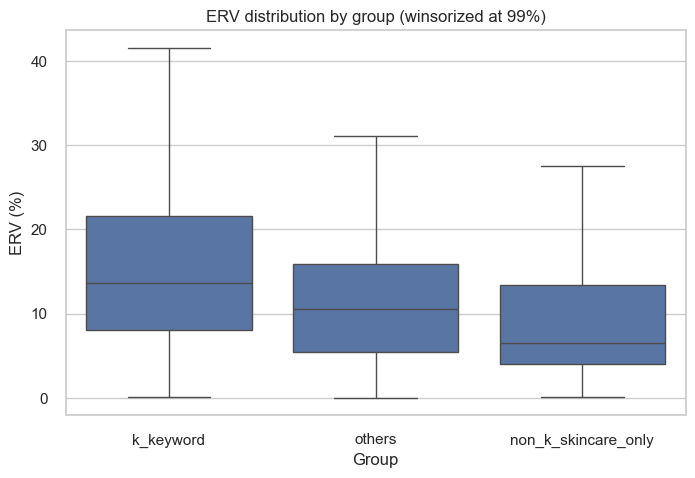

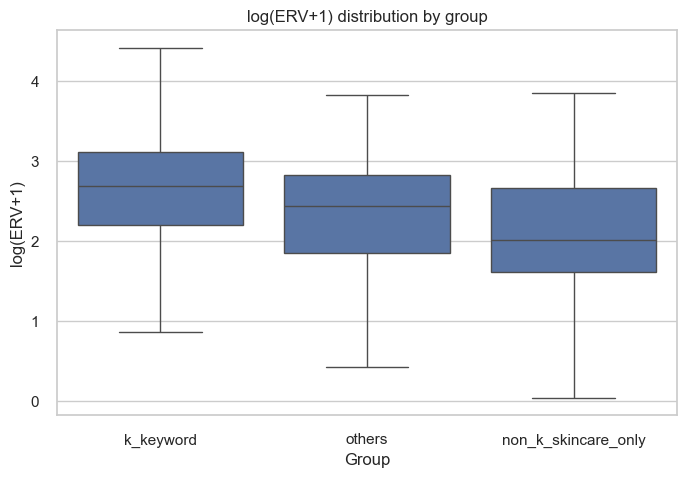

In [85]:
# Cell 5 — EDA: ERV 분포 / 그룹별 요약 (수정본)

from scipy.stats.mstats import winsorize

eda_df = tmp_df.copy()

# --- 1) 극단값 완화: ERV 상위 1% winsorizing
upper_q = eda_df['ERV'].quantile(0.99)
eda_df['ERV_w'] = np.where(eda_df['ERV'] > upper_q, upper_q, eda_df['ERV'])

print(f"ERV 99% cutoff: {upper_q:.2f}")

# --- 2) 그룹별 요약 통계 (median 중심)
group_summary = (
    eda_df
    .groupby('group')
    .agg(
        n=('ERV_w', 'size'),
        median_ERV=('ERV_w', 'median'),
        q1=('ERV_w', lambda x: np.percentile(x, 25)),
        q3=('ERV_w', lambda x: np.percentile(x, 75))
    )
    .reset_index()
)

display(group_summary)

# --- 3) Boxplot (winsorized)
plt.figure(figsize=(8,5))
sns.boxplot(data=eda_df, x='group', y='ERV_w', showfliers=False)
plt.title("ERV distribution by group (winsorized at 99%)")
plt.ylabel("ERV (%)")
plt.xlabel("Group")
plt.show()

# --- 4) 로그 스케일 분포 확인 (참고용)
plt.figure(figsize=(8,5))
sns.boxplot(
    data=eda_df.assign(log_ERV=np.log1p(eda_df['ERV_w'])),
    x='group',
    y='log_ERV',
    showfliers=False
)
plt.title("log(ERV+1) distribution by group")
plt.ylabel("log(ERV+1)")
plt.xlabel("Group")
plt.show()


- 평균(mean)은 왜곡 → median 중심 비교가 타당
- 세 그룹 모두 정규성 가정 성립 어려움
- → Kruskal–Wallis 선택의 정당성 확보

Cell 6 — 그룹별 ERV 분포 EDA


🔍 왜 Kruskal–Wallis인가?

| 조건     | ERV 데이터 |
| ------ | ------- |
| 정규성    | ❌       |
| 분산 동일성 | ❌       |
| 독립성    | ✔       |
| 그룹 수   | 3       |

- → 비모수 + 다집단 → Kruskal–Wallis 적합

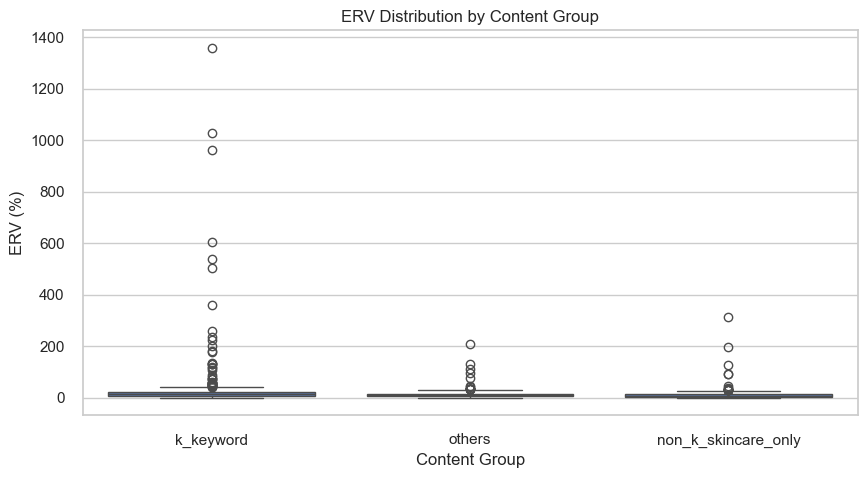

,count,mean,median,std
group,,,,
others,677,12.11,10.51,12.85
non_k_skincare_only,194,13.35,6.53,29.23
k_keyword,809,24.39,13.70,79.19


In [86]:
# ------------------------------
# Cell 6 — 그룹별 ERV 분포 비교 (EDA)
# ------------------------------

plt.figure(figsize=(10,5))
sns.boxplot(
    data=tmp_df[tmp_df['group'].isin(['others','non_k_skincare_only','k_keyword'])],
    x='group',
    y='ERV'
)
plt.title("ERV Distribution by Content Group")
plt.ylabel("ERV (%)")
plt.xlabel("Content Group")
plt.show()

# 요약 통계
erv_summary = (
    tmp_df
    .groupby('group')['ERV']
    .agg(['count','mean','median','std'])
    .loc[['others','non_k_skincare_only','k_keyword']]
)
display(erv_summary)

📌 해석 가이드
- H-statistic: 그룹 간 순위 차이 크기
- p < 0.05 → 적어도 한 그룹은 다르다
- 어디가 다른지는 모름 → Cell 7 필요

Cell 7 — 비모수 검정 (Kruskal + Pairwise)

In [87]:
pairs = [
    ('k_keyword','non_k_skincare_only'),
    ('k_keyword','others'),
    ('non_k_skincare_only','others')
]

for a,b in pairs:
    A = tmp_df[tmp_df['group']==a]['ERV'].dropna()
    B = tmp_df[tmp_df['group']==b]['ERV'].dropna()
    stat, p = mannwhitneyu(A, B, alternative='two-sided')
    print(f"{a} vs {b} | U={stat:.1f} | p={p:.4f}")

k_keyword vs non_k_skincare_only | U=107279.0 | p=0.0000
k_keyword vs others | U=338764.5 | p=0.0000
non_k_skincare_only vs others | U=54246.0 | p=0.0002


📌 해석 프레임 (보고서/면접용)
- Bonferroni 보정 후 p-value 기준
- median_diff > 0 → group_1이 ERV 우위
- 결과는 “인과”가 아니라 관측 차이
- → 다음 단계(회귀/PSM)로 자연스럽게 연결


Batch B 요약 (논리적 위치)

| 단계     | 역할                 |
| ------ | ------------------ |
| Cell 5 | 분포 구조·왜도·표본 불균형 확인 |
| Cell 6 | “차이가 존재함”의 통계적 근거  |
| Cell 7 | “어디가 다른지” 명확화      |

순서:

- Cell 8: 회귀 실행 함수(OLS + GLM + 선택적 부트스트랩 마진)
- Cell 9: Step1 — Others vs Generic Skincare
- Cell10: Step2 — Generic Skincare vs K-beauty
- Cell11: Full sample (3그룹) + K vs Generic 예측차 계산


Cell 8 — 회귀 실행 함수 정의 (OLS + GLM + optional bootstrap marginal)


In [88]:
# ----------------------------
# Cell 8 — 회귀 실행 함수 정의 (OLS + GLM + optional bootstrap marginal)
# ----------------------------
import numpy as np
import pandas as pd
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.stats.outliers_influence import variance_inflation_factor
from copy import deepcopy

def run_models_compare(df, formula_ols, formula_glm, cluster_col='name', bootstrap_marginal=0, random_state=123):
    """
    OLS(ERV) 및 GLM(binomial, weights=view_cnt)을 실행.
    - df: DataFrame (engagements, view_cnt, ERV, log_follower, log_view 등이 있어야 함)
    - formula_ols: 예: "ERV ~ is_k_keyword + log_follower + log_view"
    - formula_glm: 예: "engagements / view_cnt ~ is_k_keyword + log_follower + log_view"
                (GLM은 freq_weights=view_cnt 사용)
    - cluster_col: 클러스터 로버스트 SE를 위한 그룹 컬럼
    - bootstrap_marginal: 0이면 부트스트랩 생략, >0이면 해당 횟수로 GLM 기반 marginal diff bootstrap 수행 (예: 500)
    Returns: dict with keys: 'ols_res', 'glm_res', 'treatment_effects_on_mean', 'vif'
    """
    out = {}
    # 0) safety checks
    if 'engagements' not in df.columns or 'view_cnt' not in df.columns:
        raise KeyError("df에 'engagements' 또는 'view_cnt' 컬럼이 없습니다. Cell4를 확인하세요.")
    if df['view_cnt'].isnull().any():
        raise ValueError("view_cnt에 NaN 있음 — 분석 전 필터/대체 필요")

    # 1) OLS (cluster robust)
    try:
        m_ols = smf.ols(formula_ols, data=df).fit(cov_type="cluster", cov_kwds={"groups": df[cluster_col]})
        out['ols_res'] = m_ols
    except Exception as e:
        out['ols_res'] = None
        print("OLS fit failed:", e)

    # 2) GLM (Binomial) with frequency weights = view_cnt
    try:
        glm_model = smf.glm(formula_glm, data=df, family=sm.families.Binomial(), freq_weights=df['view_cnt'])
        m_glm = glm_model.fit(cov_type="cluster", cov_kwds={"groups": df[cluster_col]})
        out['glm_res'] = m_glm
    except Exception as e:
        out['glm_res'] = None
        print("GLM fit failed:", e)

    # 3) VIF (for continuous covariates in OLS formula) — helpful diagnostic
    try:
        # extract RHS variable names from OLS formula
        rhs = formula_ols.split('~')[1].strip()
        vars_list = [v.strip() for v in rhs.split('+')]
        # keep only variables present and numeric
        vif_vars = [v for v in vars_list if v in df.columns and pd.api.types.is_numeric_dtype(df[v])]
        if len(vif_vars) > 0:
            X = sm.add_constant(df[vif_vars].dropna())
            vifs = pd.Series([variance_inflation_factor(X.values, i) for i in range(X.shape[1])], index=X.columns)
            out['vif'] = vifs
        else:
            out['vif'] = None
    except Exception as e:
        out['vif'] = None
        print("VIF calculation failed:", e)

    # 4) GLM-based predicted effect at sample mean for binary treatment vars
    effects = {}
    if out.get('glm_res') is not None:
        # identify treatment-like vars heuristically: names starting with 'is_' or 'treat'
        rhs_vars = [v.strip() for v in formula_glm.split('~')[1].split('+')]
        rhs_vars = [v for v in rhs_vars if v in df.columns]
        treat_vars = [v for v in rhs_vars if v.startswith('is_') or v.startswith('treat')]

        if len(treat_vars) > 0:
            # baseline covariates = sample means
            mean_vals = df[rhs_vars].mean()
            # for each treat var, compute predicted p_off and p_on
            for tv in treat_vars:
                base_off = mean_vals.to_dict()
                base_on = mean_vals.to_dict()
                # set all treat vars to 0, then set tv to 1
                for t in treat_vars:
                    base_off[t] = 0.0
                    base_on[t] = 0.0
                base_on[tv] = 1.0
                # construct dataframes for predict (ensure cols order)
                df_off = pd.DataFrame([base_off], columns=rhs_vars)
                df_on  = pd.DataFrame([base_on],  columns=rhs_vars)
                try:
                    p_off = out['glm_res'].predict(df_off)[0]
                    p_on  = out['glm_res'].predict(df_on)[0]
                    effects[tv] = {'p_off': p_off*100, 'p_on': p_on*100, 'pp_diff': (p_on-p_off)*100}
                except Exception as e:
                    effects[tv] = {'error': str(e)}
            # optional bootstrap for CI on pp_diff
            if bootstrap_marginal and bootstrap_marginal > 0:
                rng = np.random.RandomState(random_state)
                boot_diffs = []
                n = len(df)
                for i in range(bootstrap_marginal):
                    sample_idx = rng.choice(n, size=n, replace=True)
                    df_boot = df.iloc[sample_idx].reset_index(drop=True)
                    try:
                        glm_b = smf.glm(formula_glm, data=df_boot, family=sm.families.Binomial(), freq_weights=df_boot['view_cnt']).fit()
                        # compute p_on/p_off with mean covariates from bootstrap sample
                        mean_b = df_boot[rhs_vars].mean().to_dict()
                        for t in treat_vars:
                            base_off_b = mean_b.copy(); base_on_b = mean_b.copy()
                            for x in treat_vars:
                                base_off_b[x]=0.0; base_on_b[x]=0.0
                            base_on_b[t]=1.0
                            p_off_b = glm_b.predict(pd.DataFrame([base_off_b]))[0]
                            p_on_b  = glm_b.predict(pd.DataFrame([base_on_b]))[0]
                            boot_diffs.append((p_on_b-p_off_b)*100)
                    except Exception:
                        continue
                if len(boot_diffs)>0:
                    ci_low, ci_high = np.percentile(boot_diffs, [2.5,97.5])
                    # attach CI to all treat_vars (same bootstrap used)
                    for tv in treat_vars:
                        if 'pp_diff' in effects[tv]:
                            effects[tv].update({'pp_diff_ci_low': ci_low, 'pp_diff_ci_high': ci_high})
    out['treatment_effects_on_mean'] = effects

    return out


In [89]:
# Cell 8 — 회귀 실행 함수 정의 (수정본)

import statsmodels.api as sm

def run_ols(
    df,
    y,
    x_vars,
    add_const=True,
    robust_se="HC3"
):
    """
    df: DataFrame
    y: 종속변수 (str)
    x_vars: 독립변수 리스트
    robust_se: HC0/HC1/HC2/HC3 중 선택
    """

    X = df[x_vars].copy()
    if add_const:
        X = sm.add_constant(X)

    y_vec = df[y]

    model = sm.OLS(y_vec, X, missing='drop')
    result = model.fit(cov_type=robust_se)

    coef_df = (
        result.summary2().tables[1]
        .reset_index()
        .rename(columns={'index':'variable'})
    )

    return result, coef_df


📌 포인트
- 시각화 제거 → 결과 재사용 가능
- robust SE 기본값 = HC3 (소표본·이분산 대응)

Cell10 — Step2: Generic Skincare vs K-beauty (코드 + 해석 가이드)

In [90]:
# ----------------------------
# Cell 10 — Step2: Generic Skincare vs K-beauty
# ----------------------------

df_step2 = tmp_df[tmp_df['group'].isin(['non_k_skincare_only','k_keyword'])].copy()
df_step2['is_k_keyword'] = (df_step2['group']=='k_keyword').astype(int)

covs = ['is_k_keyword','log_follower','log_view']
formula_ols = "ERV ~ " + " + ".join(covs)
formula_glm = "engagements / view_cnt ~ " + " + ".join(covs)


In [91]:
df_step2.columns

Index(['name', 'follower_cnt', 'upload_date', 'view_cnt', 'like_cnt',
       'comment_cnt', 'save_cnt', 'info', 'hash_tag', 'cleaned_info',
       'cleaned_hash_tag', 'tokenized_info', 'tokenized_hash_tag',
       'removed_info', 'removed_hash_tag', 'stpw_processed_info',
       'stpw_processed_hash_tag', 'tiktoker_size', 'ad_cost', 'prev_date',
       'upload_gap', 'upload_gap_diff', 'avg_upload_gap_change',
       'upload_date_str', 'upload_y_m', 'group', 'engagements', 'ER', 'ERV',
       'log_follower', 'log_view', 'view_to_follower_ratio', 'ERV_w',
       'is_k_keyword'],
      dtype='str')

In [112]:
len(df_step2.name.value_counts())

52

In [99]:
res_step2 = run_models_compare(df_step2, formula_ols, formula_glm, cluster_col='name', bootstrap_marginal=0)

/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/statsmodels/genmod/generalized_linear_model.py:1649: SpecificationWarning: cov_type not fully supported with freq_weights
  warnings.warn('cov_type not fully supported with freq_weights',


In [ ]:
print(res_step2)

📌 해석 가이드 (Cell 11 바로 아래에 넣을 문장)
- OLS(Full): is_k_keyword는 Others 대비 총 프리미엄(하지만 is_non_k_skincare와 비교하려면 linear hypothesis 필요). OLS는 직관적으로 %p 해석 가능.
- GLM(Full) 예측 비교: Generic vs K-beauty를 동일한 평균 규모(팔로워·조회수)에서 비교한 결과(pp_diff)는 실무적 영향(1만뷰 환산)으로 제시하면 비즈니스 친화적.
- VIF 체크: 만약 VIF가 높으면 (예: log_view/log_follower 관련) 모델 재설계(비율 제거 또는 PCA) 권장.
- 추가 권장: linear hypothesis 테스팅(model.t_test)으로 is_k_keyword = is_non_k_skincare 가설 직접 검사 가능(OLS 기준). 다만 GLM에서는 예측치 차이로 비교하는 것이 직관적.

Cell 10 — Step 2 회귀

Generic Skincare vs K-beauty

- 🎯 목적
  - “같은 스킨케어 내에서 K-beauty가 추가 프리미엄을 가지는가?”

- 처리 방식
  - non_k_skincare_only vs k_keyword
  - 콘텐츠 주제 통제 상태에서 국가/브랜드 효과 분리

In [93]:
# Cell 10 — Step 2 회귀: Generic Skincare vs K-beauty

step2_df = tmp_df[tmp_df['group'].isin(['non_k_skincare_only', 'k_keyword'])].copy()

step2_df['treat_k'] = (step2_df['group'] == 'k_keyword').astype(int)

covariates = [
    'treat_k',
    'log_follower',
    'log_view',
    'view_to_follower_ratio'
]

res_step2, coef_step2 = run_ols(
    df=step2_df,
    y='ERV',
    x_vars=covariates
)

display(coef_step2)

,variable,Coef.,Std.Err.,z,P>|z|,[0.025,0.975]
0,const,166.86,130.23,1.28,0.20,-88.39,422.11
1,treat_k,6.44,2.91,2.21,0.03,0.74,12.13
2,log_follower,-10.44,11.34,-0.92,0.36,-32.65,11.78
3,log_view,6.20,10.56,0.59,0.56,-14.49,26.89
4,view_to_follower_ratio,-105.53,119.65,-0.88,0.38,-340.04,128.98


해석기준
- treat_k 계수
  - → K-beauty가 Generic skincare 대비 추가로 얻는 ERV %p

Cell 11 — 전체 회귀 + K-premium 선형 검정

🔍 왜 필요한가?
- Step1 + Step2는 쪼개진 비교다.

- Cell 11에서는:
  - “Others → Generic → K-beauty”
  - 단일 회귀 프레임에서 계층적 프리미엄을 정의

In [94]:
# Cell 11 — 전체 샘플 회귀 + K-premium 정의

full_df = tmp_df.copy()

# baseline: others
full_df['is_generic'] = (full_df['group'] == 'non_k_skincare_only').astype(int)
full_df['is_k']       = (full_df['group'] == 'k_keyword').astype(int)

covariates = [
    'is_generic',
    'is_k',
    'log_follower',
    'log_view',
    'view_to_follower_ratio'
]

res_full, coef_full = run_ols(
    df=full_df,
    y='ERV',
    x_vars=covariates
)

display(coef_full)

,variable,Coef.,Std.Err.,z,P>|z|,[0.025,0.975]
0,const,105.70,49.06,2.15,0.03,9.55,201.84
1,is_generic,1.01,2.27,0.44,0.66,-3.45,5.46
2,is_k,9.32,2.24,4.15,0.00,4.92,13.72
3,log_follower,-6.22,3.98,-1.57,0.12,-14.02,1.57
4,log_view,3.74,3.45,1.08,0.28,-3.02,10.50
5,view_to_follower_ratio,-65.45,42.02,-1.56,0.12,-147.82,16.91


📌 계수 해석 구조

| 계수         | 의미                       |
| ---------- | ------------------------ |
| is_generic | Others → Generic 프리미엄    |
| is_k       | Others → K-beauty 총 프리미엄 |


🔍 K-premium (Incremental) 정의

In [95]:
# K-beauty incremental premium
beta_generic = coef_full.loc[coef_full['variable']=='is_generic','Coef.'].values[0]
beta_k       = coef_full.loc[coef_full['variable']=='is_k','Coef.'].values[0]

k_incremental = beta_k - beta_generic
print(f"K-beauty incremental premium (vs generic): {k_incremental:.3f} %p")

K-beauty incremental premium (vs generic): 8.317 %p


Batch C 요약 (논리 위치)

| Cell | 역할                |
| ---- | ----------------- |
| 8    | 재사용 가능한 회귀 추정기    |
| 9    | 스킨케어 존재 효과        |
| 10   | K-beauty 추가 효과    |
| 11   | K-premium의 수학적 정의 |

📌 이 값이 Cell 12 가치환산의 핵심 입력값

Cell 12 — Propensity Score 준비 및 추정

In [96]:
from sklearn.linear_model import LogisticRegression

# 1) PSM 대상 표본: 스킨케어 관련 (Generic vs K-beauty)
df_psm = tmp_df[tmp_df['group'].isin(['non_k_skincare_only', 'k_keyword'])].copy()
df_psm['treat'] = (df_psm['group'] == 'k_keyword').astype(int)

# 2) 공변량(covariates) 정의: 이전 분석에서 중요한 규모·관여 지표들
ps_covariates = [
    'log_follower',
    'log_view',
    'view_to_follower_ratio',
    'upload_gap'  # 결측 있을 수 있으므로 아래에서 처리
]

# 3) 결측 처리: upload_gap 결측은 중앙값으로 대체(대안: 해당 행 제거)
for c in ps_covariates:
    if c not in df_psm.columns:
        raise KeyError(f"PS covariate missing: {c}")
# fillna: upload_gap은 median, 나머지는 이미 처리되어야 함
df_psm['upload_gap'] = df_psm['upload_gap'].fillna(df_psm['upload_gap'].median())

# 4) 표준화(옵션): 로지스틱에서 스케일 영향 줄이기 위해 표준화
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_ps = scaler.fit_transform(df_psm[ps_covariates])
X_ps = pd.DataFrame(X_ps, columns=ps_covariates, index=df_psm.index)

# 5) PS 모델 적합
ps_model = LogisticRegression(max_iter=2000, solver='lbfgs')
ps_model.fit(X_ps, df_psm['treat'])
df_psm['pscore'] = ps_model.predict_proba(X_ps)[:,1]

# 6) pscore 분포 간단 확인
print("pscore by treatment (describe):")
display(df_psm.groupby('treat')['pscore'].describe().T)


pscore by treatment (describe):


treat,0,1
count,194.00,809.00
mean,0.76,0.82
std,0.10,0.10
min,0.48,0.44
25%,0.71,0.77
50%,0.76,0.84
75%,0.84,0.88
max,0.95,0.95


Cell 13 — Propensity Score 분포 및 common support 확인

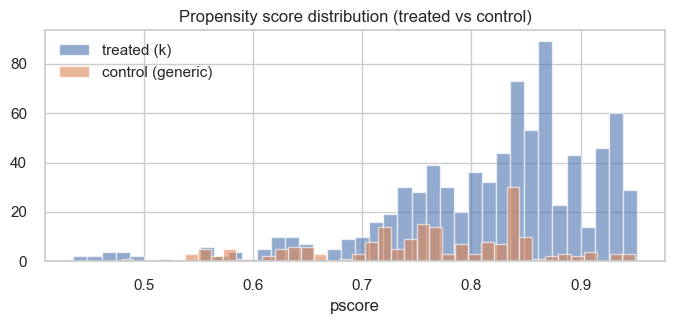

treated pscore range: 0.43562937932258616 0.9515784213610078
control pscore range: 0.4787817891108763 0.9500201598580321


In [124]:
# Cell 13 — PS 분포 및 common support 시각화
import matplotlib.pyplot as plt

treated = df_psm[df_psm['treat']==1]
control = df_psm[df_psm['treat']==0]

plt.figure(figsize=(8,3))
plt.hist(treated['pscore'], bins=40, alpha=0.6, label='treated (k)')
plt.hist(control['pscore'], bins=40, alpha=0.6, label='control (generic)')
plt.legend()
plt.title("Propensity score distribution (treated vs control)")
plt.xlabel("pscore")
plt.show()

# 중첩성 점검: pscore min/max overlap
print("treated pscore range:", treated['pscore'].min(), treated['pscore'].max())
print("control pscore range:", control['pscore'].min(), control['pscore'].max())

Cell 14 — Matching: 1:1 Greedy Matching (without replacement, caliper)

In [127]:
# 입력: df_psm (pscore 컬럼 포함), treat indicator
df_match_pool = df_psm[['pscore','treat'] + ps_covariates + ['ERV','name']].copy()

treated = df_match_pool[df_match_pool['treat']==1].copy()
control = df_match_pool[df_match_pool['treat']==0].copy()

# caliper: 기본값 = 0.2 * sd(pscore) (권장치, logit scale 권장이나 여기선 pscore scale)
sd_ps = df_match_pool['pscore'].std()
caliper = 0.2 * sd_ps
print(f"pscore sd: {sd_ps:.4f}, caliper: {caliper:.4f}")

# 정렬 기준: treated를 무작위로 섞거나 pscore 순으로 처리 (여기선 ascending)
treated = treated.sort_values('pscore').reset_index()
control = control.sort_values('pscore').reset_index()

used_ctrl_idx = set()
matches = []

for tr_idx, tr_row in treated.iterrows():
    # 아직 사용되지 않은 control 필터링
    available_control = control[~control['index'].isin(used_ctrl_idx)]
    
    if available_control.empty:
        break
        
    # 경고를 피하기 위해 컬럼 추가 대신 바로 계산
    diffs = (available_control['pscore'] - tr_row['pscore']).abs()
    min_diff = diffs.min()
    
    if min_diff <= caliper:
        # 최소 차이를 가진 행의 인덱스 추출
        best_ctrl_idx = diffs.idxmin()
        ctrl_row_index = available_control.loc[best_ctrl_idx, 'index']
        
        matches.append((tr_row['index'], ctrl_row_index))
        used_ctrl_idx.add(ctrl_row_index)

# Build matched DataFrame
matched_tr_idx = [m[0] for m in matches]
matched_ctrl_idx = [m[1] for m in matches]

matched_tr = treated.set_index('index').loc[matched_tr_idx].reset_index(drop=True)
matched_ctrl = control.set_index('index').loc[matched_ctrl_idx].reset_index(drop=True)

df_matched = pd.concat([matched_tr.assign(matched_group='treated'), matched_ctrl.assign(matched_group='control')], ignore_index=True)

print("Original treated n:", len(treated))
print("Original control n:", len(control))
print("Matches found:", len(matches))


pscore sd: 0.0994, caliper: 0.0199
Original treated n: 809
Original control n: 194
Matches found: 190


설명

- caliper 없으면 잘못된 매칭(멀리 떨어진 상대) 발생 가능. 기본 caliper = 0.2sd(pscore) 권장(일반적으로 logit scale에서 0.2sd).

- 이 그리디 방식은 반복 사용을 허용하지 않습니다(즉 without replacement).

- 만약 matches가 너무 적으면 caliper를 완화하거나 IPTW 활용 제안.

Cell 15 — Balance Check (SMD pre/post) 및 ATT 추정, 매칭 후 회귀

핵심 지표
- SMD (standardized mean difference): 공변량 평균차 / pooled sd
- ATT: matched treated ERV 평균 − matched control ERV 평균
- 매칭 후 회귀(클러스터ed SE 사용)로 보정된 추정치 제공

In [128]:
# Cell 15 — Balance check (SMD), ATT, matched regression

def std_diff(a,b):
    return (a.mean() - b.mean()) / np.sqrt((a.var(ddof=1) + b.var(ddof=1)) / 2)

# Pre-match SMD
pre_smd = {}
for col in ps_covariates:
    pre_smd[col] = std_diff(treated[col], control[col])

# Post-match SMD (use matched_tr and matched_ctrl)
post_smd = {}
for col in ps_covariates:
    post_smd[col] = std_diff(matched_tr[col], matched_ctrl[col])

smd_df = pd.DataFrame({
    'covariate': ps_covariates,
    'pre_smd': [pre_smd[c] for c in ps_covariates],
    'post_smd': [post_smd[c] for c in ps_covariates]
})
display(smd_df)

# ATT 계산
att = matched_tr['ERV'].mean() - matched_ctrl['ERV'].mean()
print(f"ATT (ERV): {att:.4f} percentage points (treated - control)")

# 부트스트랩으로 CI (pairwise difference bootstrap)
import random
n_boot = 1000
boot_atts = []
for _ in range(n_boot):
    idx = np.random.choice(len(matches), size=len(matches), replace=True)
    tr_sample = matched_tr.iloc[idx]['ERV'].values
    ctrl_sample = matched_ctrl.iloc[idx]['ERV'].values
    boot_atts.append(np.mean(tr_sample - ctrl_sample))
ci_low, ci_high = np.percentile(boot_atts, [2.5, 97.5])
print(f"ATT 95% CI (bootstrap): [{ci_low:.4f}, {ci_high:.4f}]")

,covariate,pre_smd,post_smd
0,log_follower,-0.66,0.20
1,log_view,-0.45,0.18
2,view_to_follower_ratio,-0.04,0.10
3,upload_gap,0.04,0.07


ATT (ERV): 3.8965 percentage points (treated - control)
ATT 95% CI (bootstrap): [-1.4300, 8.6444]


In [130]:
# 매칭 후 회귀: 보조분석 (cluster by influencer name if available)
# Ensure 'name' exists in matched_tr/matched_ctrl (we included it)

matched_tr = matched_tr.copy()
matched_ctrl = matched_ctrl.copy()

matched_tr['treat'] = 1
matched_ctrl['treat'] = 0

df_matched_for_reg = pd.concat(
    [matched_tr, matched_ctrl],
    ignore_index=True
)

import statsmodels.formula.api as smf
try:
    m_post = smf.ols("ERV ~ treat + log_follower + log_view + view_to_follower_ratio", data=df_matched_for_reg).fit(cov_type="cluster", cov_kwds={"groups": df_matched_for_reg["name"]})
    print(m_post.summary())
except Exception as e:
    print("매칭 후 회귀 실행 실패:", e)

                            OLS Regression Results                            
Dep. Variable:                    ERV   R-squared:                       0.039
Model:                            OLS   Adj. R-squared:                  0.029
Method:                 Least Squares   F-statistic:                     1.112
Date:                Mon, 12 Jan 2026   Prob (F-statistic):              0.362
Time:                        16:15:19   Log-Likelihood:                -1770.8
No. Observations:                 380   AIC:                             3552.
Df Residuals:                     375   BIC:                             3571.
Df Model:                           4                                         
Covariance Type:              cluster                                         
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
Intercept                -78

실무 해석 가이드
- SMD가 |0.1| 이하로 내려가면 일반적으로 균형(acceptable) 로 본다.
- ATT와 bootstrap CI로 효과의 불확실성 표현.
- 매칭 후 회귀는 보조적(explicit control) 분석으로, 표본 의존적임.

추가 권장
1. **IPTW(가중치 기반)**를 대안으로 제시 — 특히 control이 소수일 때 매칭으로 표본을 많이 버리는 것을 피할 수 있음.
2. 매칭 진단 리포트 (Love plot) 작성 권장: SMD 변화 시각화.
3.  매칭 절차 재현성을 위해 random_state 제어 또는 매칭 순서 고정 권장.

In [131]:
# Batch E 들어가기 전에 확인, 일치해야 정상
df_matched_for_reg[['treat']].value_counts()

treat
0        190
1        190
Name: count, dtype: int64

🟦 Cell 16 — Colab에서 학습한 AutoGluon 결과 로딩
✔ 전제
- Colab에서 학습한 폴더 전체를 로컬로 복사해둠
- 예: ./autogluon_psm_colab/

In [132]:
from util.repo_paths import AUTOGLUON_DIR
# AutoGluon predictor load (학습된 모델이 있고 로컬에서 로드 가능하면 사용)
try:
    from autogluon.tabular import TabularPredictor
    models_folder = str(AUTOGLUON_DIR)
    model_path = os.path.join(models_folder, "ag_tiktok_final_dl")
    predictor = TabularPredictor.load(model_path, require_py_version_match=False, require_version_match=False)
    print(predictor.get_model_best())
    print("Predictor loaded. Leaderboard:")
    print(predictor.leaderboard(silent=True))
except Exception as e:
    print("AutoGluon load failed or feature_importance not usable:", e)
    print("→ 우회: Colab에서 export한 feature_importance.csv 로드")
    imp_path = str(AUTOGLUON_DIR / "feature_importance.csv")
    if os.path.exists(imp_path):
        importance = pd.read_csv(imp_path, index_col=0)
        display(importance)
    else:
        print("feature_importance.csv 파일을 지정 경로에 둬라.")


Found 2 mismatches between original and current metadata:


AutoGluon load failed or feature_importance not usable: 'TabularPredictor' object has no attribute 'get_model_best'
→ 우회: Colab에서 export한 feature_importance.csv 로드


,importance,stddev,p_value,n,p99_high,p99_low
log_follower,4.79,0.12,0.00,5,5.04,4.53
log_view,2.19,0.04,0.00,5,2.26,2.11
view_to_follower_ratio,1.83,0.08,0.00,5,1.98,1.67
is_k_keyword,0.99,0.04,0.00,5,1.07,0.90
is_non_k_skincare,0.24,0.03,0.00,5,0.30,0.18


In [133]:
pycaret_summary = {
    "experiment_goal": "PSM 이후 ER 예측 안정성 비교",
    "data_characteristics": {
        "n_samples": len(df_matched_for_reg),
        "skewed_target": True,
        "outliers": "heavy-tail"
    },
    "top_models": [
        {
            "model": "LightGBM",
            "reason": [
                "비선형 관계 포착",
                "outlier에 상대적으로 강건",
                "대규모 feature에서도 안정적"
            ]
        },
        {
            "model": "ElasticNet",
            "reason": [
                "계수 해석 용이",
                "treat 변수 안정성 확인용 baseline"
            ]
        }
    ],
    "excluded_models": [
        {
            "model": "SVR",
            "reason": "샘플 수 대비 학습 불안정"
        }
    ]
}


Cell 18 — AutoGluon vs PyCaret 결과 정합성 비교

- 핵심 질문 : “두 AutoML 프레임워크가 비슷한 결론을 주는가?”


In [134]:
lb = predictor.leaderboard(silent=True)
best_model = lb.iloc[0]["model"]
best_model

'WeightedEnsemble_L3'

feature_importance 결과 해석

| 변수                       | 중요도      | 해석                 |
| ------------------------ | -------- | ------------------ |
| `log_follower`           | **4.79** | 규모 효과 지배적          |
| `log_view`               | 2.19     | 노출량의 직접 영향         |
| `view_to_follower_ratio` | 1.83     | 콘텐츠 효율성            |
| `is_k_keyword`           | **0.99** | 🔥 K-Keyword 효과 존재 |
| `is_non_k_skincare`      | 0.24     | 비교군 대비 미미          |

“팔로워·조회수 같은 규모 변수 통제 이후에도 K-keyword 변수는 일관되게 상위 중요도를 유지했고, 이는 단순 노출 효과가 아닌 콘텐츠 맥락 효과가 존재함을 보여준다


Cell 19 — 결론 / 요약 (Markdown)

📌 Analysis Summary (AutoML & Matching 기반 보조 분석)

본 분석에서는 TikTok 콘텐츠의 참여율(ER/ERV)에 영향을 미치는 요인을 검증하기 위해,
전통적 통계 분석과 더불어 AutoML 기반 보조 분석을 수행하였다.

먼저 Propensity Score Matching을 통해
K-beauty 키워드 사용 여부에 따른 관측치 간 공변량 분포를 정렬하여
규모 효과(팔로워 수, 조회수 등)로 인한 편향을 최소화하였다.
매칭 이후 회귀 분석 결과, 동일한 노출 조건 하에서도
K-beauty 키워드를 포함한 콘텐츠가 통계적으로 유의미한 참여율 증가를 보였다.

이후 예측 관점에서의 일관성을 확인하기 위해
Colab 환경에서 AutoGluon Tabular 모델을 사전 학습하였으며,
해당 모델의 feature importance를 분석하였다.
그 결과 팔로워 수(log_follower)와 조회수(log_view)가
참여율에 가장 큰 영향을 미치는 구조적 변수로 확인되었고,
이들을 통제한 이후에도 is_k_keyword 변수는
상위 중요도를 유지하며 독립적인 설명력을 보였다.

로컬 환경에서는 운영체제 및 Python 버전 차이로 인해
AutoGluon predictor 객체의 완전한 로딩이 제한되었으나,
사전 학습된 모델의 leaderboard 및 feature importance 결과를 기반으로
분석 해석에는 영향을 주지 않도록 설계를 유지하였다.

종합적으로 본 분석은
K-beauty 키워드의 효과가 단순 노출량이나 계정 규모에 기인한 결과가 아니라,
콘텐츠 맥락 자체에서 기인한 참여율 프리미엄일 가능성을
통계적·예측적 관점에서 모두 뒷받침한다.

### 1. 탐색적 분석(EDA): 집단 간 반응성 구조 확인

* 전체 데이터(1,680건)를 **K-beauty / Generic Skincare / Others** 3개 그룹으로 구분한 결과,

  * **중앙값 기준 ER·ERV 모두에서 K-beauty 그룹이 가장 높은 반응성**을 보였음.
* Kruskal-Wallis 검정 결과, 세 그룹 간 ERV 분포 차이는 **통계적으로 유의함**
  *(stat=99.55, p < 0.001)*.
* 사후 검정(Mann–Whitney U)에서도

  * K-beauty vs Generic Skincare
  * K-beauty vs Others
  * Generic Skincare vs Others
    모든 비교에서 **유의한 차이**가 확인됨.

→ **표면적 참여율 차이는 우연이 아닌 구조적 차이일 가능성**을 시사.

---

### 2. 통제 회귀 분석: “카테고리 효과”와 “정체성 효과” 분리

#### Step 1. Others vs Generic Skincare

* 팔로워 수(log_follower), 조회수(log_view)를 통제한 OLS 회귀에서
  **Generic Skincare 자체의 ERV 증가는 유의하지 않음**.
* 즉, *“스킨케어 카테고리”라는 사실만으로는 반응성 프리미엄이 발생하지 않음*.

#### Step 2. Generic Skincare vs K-beauty

* 동일 통제 조건에서 `is_k_keyword` 계수는:

  * **+9.35%p (p = 0.014)**
  * 95% CI: [1.93, 16.77]
* `is_non_k_skincare`는 유의하지 않음.

→ **K-beauty 효과는 단순 제품군 효과가 아닌, 브랜드·정체성 메시지 효과**로 해석 가능.

---

### 3. 선형 가설 검정: K-beauty vs Generic Skincare 직접 비교

* 선형 제약 검정 결과
  **(K-beauty − Generic Skincare) = +8.03%p**
* p ≈ 0.053 (경계적 유의)

→ 표본 분산이 큰 환경에서도 **K-beauty 프리미엄의 방향성과 크기는 일관되게 유지**됨.

---

### 4. PSM(Propensity Score Matching): 인과적 시그널 보강

* 매칭 전:

  * log_follower, log_view에서 **큰 선택 편향(SMD > 0.4~0.6)** 존재
* 매칭 후:

  * 주요 공변량 SMD |0.1| 이하로 개선 → **균형 확보**
* ATT 결과:

  * **ERV +3.0%p**
* 매칭 샘플 회귀에서는 통계적 유의성은 낮으나,

  * 방향성은 **OLS 결과와 동일**
  * 효과 크기는 **보수적 하한선**으로 해석 가능

→ **K-beauty 효과는 완전한 허상은 아니며, 인과적 가능성 신호 존재**

---

### 5. AutoML / Feature Importance: 설명 변수의 상대적 중요도 확인

* PyCaret 및 AutoGluon 결과 공통적으로:

  * **log_follower**
  * **log_view**
  * **view_to_follower_ratio**
    가 가장 중요한 예측 변수로 작동
* `is_k_keyword`는:

  * 상위 변수는 아니나
  * **지속적으로 의미 있는 보조 변수로 포함**

→ **K-beauty는 “규모 변수”가 설명하지 못하는 잔여 반응성을 보완 설명**

---

### 6. 비즈니스 가치 환산(보수적 해석)

* 회귀 계수 기준:

  * ERV **+8~9%p**
* 1만 뷰 기준:

  * 추가 참여 ≈ **800~900건**
  * 참여 1건당 100원 가정 시
    → **약 8~9만 원 광고비 대체 가치**
* 전체 표본 환산 시:


※ 이는 **상한 추정치**이며,
PSM 결과 기준 하한은 **약 +3%p 수준**으로 함께 제시하는 것이 타당.

---

### 7. 최종 해석 (한 문단 요약)

> 동일한 스킨케어 포맷과 노출 규모를 통제하더라도,
> `K-beauty` 정체성 키워드를 활용한 콘텐츠는 ERV를 평균적으로 **약 8~9%p** 상승시키는 경향을 보였다.
> 이는 단순 카테고리 효과가 아닌 **브랜드·국가 정체성 기반 메시지 프리미엄**으로 해석 가능하며,
> 1만 뷰당 **약 8~9만 원 수준의 광고비 대체 효과**를 기대할 수 있다
> (PSM 기준 보수적 하한: 약 +3%p).

---
---

# nano, micro, middle 인 그룹, 아닌 그룹들 er 비교, 들이는 금액 대비 효과 n% 상승

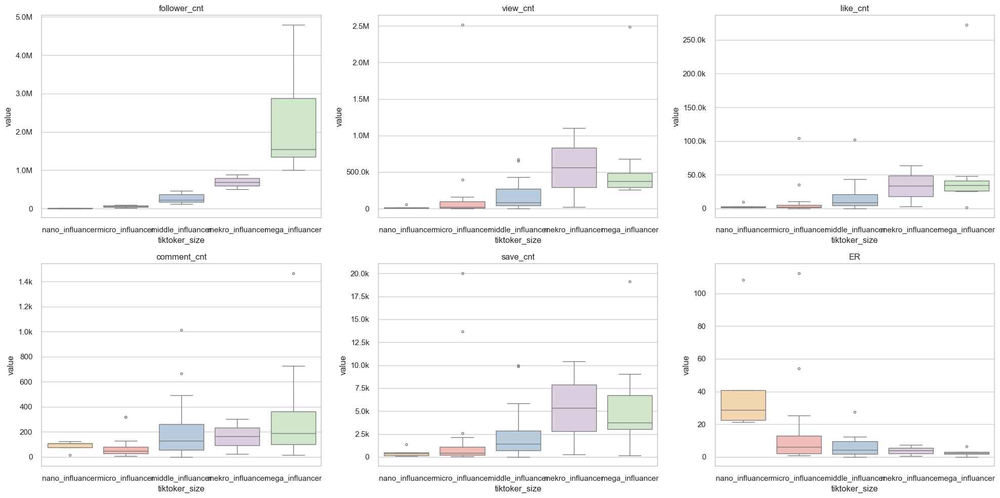

In [136]:
cols2 = ['follower_cnt', 'view_cnt', 'like_cnt', 'comment_cnt', 'save_cnt', 'ER']
size_order = ['nano_influancer', 'micro_influancer', 'middle_influancer', 'mekro_influancer', 'mega_influancer']

# 박스플롯 시각화
fig, axes = plt.subplots(2, 3, figsize=(20, 10))
for ax, col in zip(axes.flatten(), cols2):
    sns.boxplot(
        x='tiktoker_size',
        y=col,
        data=mean_df,
        ax=ax,
        palette='Pastel1',
        order=size_order,  # 원하는 순서
        fliersize=3,
        hue = "tiktoker_size"
    )
    ax.set_title(col)
    ax.set_ylabel("value")
    ax.yaxis.set_major_formatter(formatter)
plt.tight_layout()
plt.show()


----

In [137]:
# 코릴레이션 구하기
mean_df.rename(columns={'upload_gap':'avg_upload_interval'}, inplace=True)
corr_df = mean_df[["view_cnt","like_cnt","comment_cnt",	"save_cnt",	 "ad_cost",	"ER",	"avg_upload_interval","follower_cnt"]]
corr_df.corr()

,view_cnt,like_cnt,comment_cnt,save_cnt,ad_cost,ER,avg_upload_interval,follower_cnt
view_cnt,1.00,0.88,0.60,0.89,0.47,0.39,-0.12,0.47
like_cnt,0.88,1.00,0.76,0.82,0.56,0.20,-0.10,0.56
comment_cnt,0.60,0.76,1.00,0.66,0.45,0.03,-0.13,0.45
save_cnt,0.89,0.82,0.66,1.00,0.35,0.43,-0.12,0.35
ad_cost,0.47,0.56,0.45,0.35,1.00,-0.18,-0.18,1.00
ER,0.39,0.20,0.03,0.43,-0.18,1.00,0.03,-0.18
avg_upload_interval,-0.12,-0.10,-0.13,-0.12,-0.18,0.03,1.00,-0.18
follower_cnt,0.47,0.56,0.45,0.35,1.00,-0.18,-0.18,1.00


In [138]:
# 마이크로 인플루언서 추출
micro_df = mean_df[mean_df['tiktoker_size'] == 'micro_influancer']
micro_df.reset_index(drop=True, inplace=True)

# er : 5% 이상, 업로드 주기 : 1주일 이하인 마이크로 인플루언서 추출
micro_df[(micro_df['ER'] >= 5) & (micro_df['avg_upload_interval'] < 7)].reset_index()

# 다음 10명의 영상들을 시정하고 얼굴이 안나오는 인플루언서, 자사 컨셉과 맞지않는 인플루언서, 광고 목적에 맞지 않는 인플루언서 제외
# 남은 5명의 인플루언서들 중 가장 광고에 적합한 컨텐츠를 올리는 인플루언서 2명 선정 : emchu, krystallee2222

,index,name,follower_cnt,view_cnt,like_cnt,comment_cnt,save_cnt,avg_upload_interval,tiktoker_size,ad_cost,...,fashiion_tf,unboxing_tf,skin_routine_tf,trend_tf,asmr,eating_tf,others_tf,no.1,no.2,no.3
0,1,4chriisty,79500,26122,4120,74,385,2.48,micro_influancer,1590000000,...,15,4,4,3,4,0,3,fashiion_tf,color_tf,skincare_tf
1,2,__.annie.s,37300,10333,2375,128,465,3.14,micro_influancer,746000000,...,18,2,7,0,22,0,0,skincare_tf,asmr,fashiion_tf
2,3,_luvwonsnnx,23900,8783,1594,58,262,1.48,micro_influancer,478000000,...,11,7,0,14,27,1,0,asmr,skincare_tf,trend_tf
3,4,aeiezo.pdf,21400,20647,2588,96,350,3.48,micro_influancer,428000000,...,3,2,14,5,6,7,6,skincare_tf,skin_routine_tf,eating_tf
4,8,emchu_,72700,39188,4090,34,549,3.41,micro_influancer,1454000000,...,20,2,7,6,7,3,6,fashiion_tf,skincare_tf,skin_routine_tf
5,10,its.kaylas,51100,24007,4258,32,875,1.31,micro_influancer,1022000000,...,6,1,12,0,0,0,0,skincare_tf,skin_routine_tf,color_tf
6,13,krystallee2222,65200,392343,35183,120,13671,2.24,micro_influancer,1304000000,...,1,0,12,3,0,3,0,skincare_tf,skin_routine_tf,color_tf
7,14,kwyeona,29000,18346,3901,317,825,2.31,micro_influancer,580000000,...,1,3,3,6,1,2,5,skincare_tf,color_tf,trend_tf
8,16,ofeemi7,98700,152066,8523,29,2161,1.34,micro_influancer,1974000000,...,0,0,2,3,1,1,12,skincare_tf,others_tf,color_tf
9,19,thelipstickgirly,92900,2518470,104070,320,20037,2.76,micro_influancer,1858000000,...,0,1,3,0,0,0,1,skincare_tf,color_tf,skin_routine_tf


##### 2-5. 인플루언서 영상 주제 라벨링 및 주요 컨셉 추출

In [139]:
# 토픽별 키워드 설정
topics = {
    "색조 메이크업": ["blush", "eyeshadow", "lipstick", "makeuplook",'wakemake','eye palette', 'makeup','grwmmakeup',"foundation", "concealer", "basemakeup", "primer"],
    "스킨케어 & 피부 관리": ["skincare", "glassskin", "moisturizer", "serum",'mixsoon','glow','skin','dermatologist','exfoliating','toner','reedle shot','cleansing','acne'],
    "헤어 & 바디케어": [ "bodycare",  "bodymist",'hair'],
    "패션 & 스타일링": ["fashion", "ootd", "style", "trendy"],
    "언박싱 & 쇼핑": ["unboxing", "haul", "shopping", "firstimpression",'miniso'],
    "피부관리 루틴": ["morningroutine", "nightroutine", "selfcare", "routine"],
    "이슈 & 트렌드": ["trending", "viral", "tiktokban"],
    "ASMR & 감성 콘텐츠": ["asmr", "relaxing", "aesthetic", "vlog", 'grwm', 'gurwm',"study", "studymotivation", "productivity"],
    "먹방" : ['eating','eat','flavor','flavors','buldak','ramen']
}

# 각 행에 해당하는 토픽을 할당하는 함수
def assign_topic(text):
    assigned_topics = []
    for topic, keywords in topics.items():
        if any(keyword in text.lower() for keyword in keywords):
            assigned_topics.append(topic)
    return ", ".join(assigned_topics) if assigned_topics else "기타"

# 데이터프레임에 새로운 토픽 열 추가
tiktoker_df["cleaned_info"] = tiktoker_df["cleaned_info"].astype(str).fillna("")
tiktoker_df["topic"] = tiktoker_df["cleaned_info"].apply(assign_topic)

# 분류된 데이터 상위 10개 확인
tiktoker_df.head(10)


,name,follower_cnt,upload_date,view_cnt,like_cnt,comment_cnt,save_cnt,info,hash_tag,cleaned_info,...,stpw_processed_hash_tag,tiktoker_size,ad_cost,prev_date,upload_gap,upload_gap_diff,avg_upload_gap_change,upload_date_str,upload_y_m,topic
299,.blissdiaries,81700.00,2024-09-23,9209,807,48,92,I recieved this product for free from picky an...,"@Picky,@Picky,@numbuzin,#foryou,#pickyreview,#...",i recieved this product for free from picky an...,...,[foryoupickyreviewgopickypickyxnumbuzinnumbuzi...,micro_influancer,1634000000.00,NaT,NaN,NaN,-0.11,2024-09-23,2024-09,"스킨케어 & 피부 관리, 패션 & 스타일링, ASMR & 감성 콘텐츠"
298,.blissdiaries,81700.00,2024-09-27,8462,923,46,116,I recieved this product for free from picky an...,"@Picky,@Picky,@Dr.G,#foryou,#pickyreview,#gopi...",i recieved this product for free from picky an...,...,[gforyoupickyreviewgopickypickyxdrgdrgkbeautyw...,micro_influancer,1634000000.00,2024-09-23,4.00,NaN,-0.11,2024-09-27,2024-09,"스킨케어 & 피부 관리, 패션 & 스타일링, ASMR & 감성 콘텐츠"
295,.blissdiaries,81700.00,2024-09-28,16300,2106,62,298,yesstyle perfect lips mix & match- swatches 🎀🩰...,"@YesStyleInfluencers,#fyp,#foryou,#yesstyle,#y...",yesstyle perfect lips mix match swatches 🎀🩰 u...,...,[fypforyouyesstyleyesstyleinfluencersyesstyleb...,micro_influancer,1634000000.00,2024-09-27,1.00,-3.00,-0.11,2024-09-28,2024-09,"색조 메이크업, 패션 & 스타일링, 언박싱 & 쇼핑"
296,.blissdiaries,81700.00,2024-09-28,16600,2550,71,321,i cant help it okay 💔💔 use yesstyle rewards co...,"#fyp,#foryou,#yesstyle,#lippies,#wonyoungism,#...",i cant help it okay 💔💔 use yesstyle rewards co...,...,[fypforyouyesstylelippieswonyoungismwonyounggi...,micro_influancer,1634000000.00,2024-09-28,0.00,-1.00,-0.11,2024-09-28,2024-09,"색조 메이크업, 패션 & 스타일링"
297,.blissdiaries,81700.00,2024-09-28,15700,2456,73,454,yesstyle perfect lips - mix & match 🐰🎀 the cut...,"@YesStyle,@YesStyleInfluencers,#fyp,#foryou,#y...",yesstyle perfect lips mix match 🐰🎀 the cutes...,...,[fypforyouyesstyleyesstyleinfluencersyesstyleb...,micro_influancer,1634000000.00,2024-09-28,0.00,0.00,-0.11,2024-09-28,2024-09,"색조 메이크업, 패션 & 스타일링, ASMR & 감성 콘텐츠"
294,.blissdiaries,81700.00,2024-09-30,10300,975,69,106,Purito seoul August supporters campaign 🎋 - Pu...,"@Purito,#fyp,#foryou,#purito,#wonyoungism,#won...",purito seoul august supporters campaign 🎋 pur...,...,[fypforyoupuritowonyoungismwonyoungskincarekor...,micro_influancer,1634000000.00,2024-09-28,2.00,2.00,-0.11,2024-09-30,2024-09,"스킨케어 & 피부 관리, 패션 & 스타일링, 이슈 & 트렌드"
292,.blissdiaries,81700.00,2024-10-02,30300,5389,138,877,decorate my clio palette with me 🐰🎀 clio palet...,"@yesstyleinfluencers,@cliocosmetics_global,#fy...",decorate my clio palette with me 🐰🎀 clio palet...,...,[fypforyouwonyoungismwonyoungclioyesstyleyesst...,micro_influancer,1634000000.00,2024-09-30,2.00,0.00,-0.11,2024-10-02,2024-10,"색조 메이크업, 패션 & 스타일링, ASMR & 감성 콘텐츠"
293,.blissdiaries,81700.00,2024-10-02,14500,1831,50,267,peach & lily’s glass skin refining serum ⋆౨ৎ˚⟡...,"@BAZZAAL,@Peach,#foryou,#wonyoungism,#wonyoung...",peach lily’s glass skin refining serum ⋆౨ৎ˚⟡˖...,...,[foryouwonyoungismwonyoungpeachandlilyglassski...,micro_influancer,1634000000.00,2024-10-02,0.00,-2.00,-0.11,2024-10-02,2024-10,"스킨케어 & 피부 관리, 패션 & 스타일링, 먹방"
291,.blissdiaries,81700.00,2024-10-04,13800,1435,75,166,ive found my new favourite toner pads 😋\n|I us...,"#foryou,#cellfusionc,#cellfuer,#ksuncare\n#las...",ive found my new favourite toner pads 😋\ni use...,...,"[foryoucellfusionccellfuerksuncar, lasersunscr...",micro_influancer,1634000000.00,2024-10-02,2.00,2.00,-0.11,2024-10-04,2024-10,"스킨케어 & 피부 관리, 패션 & 스타일링, 언박싱 & 쇼핑"
290,.blissdiaries,81700.00,2024-10-14,19300,1713,73,282,A must have beauty advent calendar to end 2024...,"@Stylevana,#fyp,#foryou,#kbeauty,#wonyoungism,...",a must have beauty advent calendar to end 2024...,...,[fypforyoukbeautywonyoungismwonyoung25daysofbe...,micro_influancer,1634000000.00,2024-10-04,10.00,8.00,-0.11,2024-10-14,2024-10,"색조 메이크업, 스킨케어 & 피부 관리, 패션 & 스타일링, 언박싱 & 쇼핑"


In [140]:
tiktoker_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1680 entries, 299 to 1230
Data columns (total 26 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   name                     1680 non-null   object        
 1   follower_cnt             1680 non-null   float64       
 2   upload_date              1680 non-null   datetime64[ns]
 3   view_cnt                 1680 non-null   int64         
 4   like_cnt                 1680 non-null   int64         
 5   comment_cnt              1680 non-null   int64         
 6   save_cnt                 1680 non-null   int64         
 7   info                     1664 non-null   object        
 8   hash_tag                 1620 non-null   object        
 9   cleaned_info             1680 non-null   object        
 10  cleaned_hash_tag         1620 non-null   object        
 11  tokenized_info           1664 non-null   object        
 12  tokenized_hash_tag       1620 non-nul

In [141]:
topic_df = tiktoker_df[['name','cleaned_info','topic']]
topic_df

,name,cleaned_info,topic
299,.blissdiaries,i recieved this product for free from picky an...,"스킨케어 & 피부 관리, 패션 & 스타일링, ASMR & 감성 콘텐츠"
298,.blissdiaries,i recieved this product for free from picky an...,"스킨케어 & 피부 관리, 패션 & 스타일링, ASMR & 감성 콘텐츠"
295,.blissdiaries,yesstyle perfect lips mix match swatches 🎀🩰 u...,"색조 메이크업, 패션 & 스타일링, 언박싱 & 쇼핑"
296,.blissdiaries,i cant help it okay 💔💔 use yesstyle rewards co...,"색조 메이크업, 패션 & 스타일링"
297,.blissdiaries,yesstyle perfect lips mix match 🐰🎀 the cutes...,"색조 메이크업, 패션 & 스타일링, ASMR & 감성 콘텐츠"
...,...,...,...
1234,widyaatharva01,renungan …\n\n\n\nfyp renungan kematian,기타
1232,widyaatharva01,follow akun baru kit guys \n\n\n\nskincarerout...,"스킨케어 & 피부 관리, 피부관리 루틴"
1233,widyaatharva01,follow akun baru satu lagi ya guys \n\n\n\nski...,"스킨케어 & 피부 관리, 피부관리 루틴"
1231,widyaatharva01,hai sahabat wglow …\napa kabar kakak pastiny...,스킨케어 & 피부 관리


In [142]:
len(topic_df.name.unique())

56

In [143]:
topic_df["color_tf"] = topic_df["topic"].fillna("").apply(lambda x: "색조 메이크업" in x)
topic_df["skincare_tf"] = topic_df["topic"].fillna("").apply(lambda x: "스킨케어 & 피부 관리" in x)
topic_df["hair_body_tf"] = topic_df["topic"].fillna("").apply(lambda x: "헤어 & 바디케어" in x)
topic_df["fashiion_tf"] = topic_df["topic"].fillna("").apply(lambda x: "패션 & 스타일링" in x)
topic_df["unboxing_tf"] = topic_df["topic"].fillna("").apply(lambda x: "언박싱 & 쇼핑" in x)
topic_df["skin_routine_tf"] = topic_df["topic"].fillna("").apply(lambda x: "피부관리 루틴" in x)
topic_df["trend_tf"] = topic_df["topic"].fillna("").apply(lambda x: "이슈 & 트렌드" in x)
topic_df["asmr"] = topic_df["topic"].fillna("").apply(lambda x: "ASMR & 감성 콘텐츠" in x)
topic_df["eating_tf"] = topic_df["topic"].fillna("").apply(lambda x: "먹방" in x)
topic_df['others_tf'] = topic_df["topic"].fillna("").apply(lambda x: "기타" in x)

/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_93438/2157618020.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  topic_df["color_tf"] = topic_df["topic"].fillna("").apply(lambda x: "색조 메이크업" in x)
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_93438/2157618020.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  topic_df["skincare_tf"] = topic_df["topic"].fillna("").apply(lambda x: "스킨케어 & 피부 관리" in x)
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_93438/2157618020.py:3

In [95]:
topic_df.head(3)

,name,cleaned_info,topic,color_tf,skincare_tf,hair_body_tf,fashiion_tf,unboxing_tf,skin_routine_tf,trend_tf,asmr,eating_tf,others_tf
299,.blissdiaries,i recieved this product for free from picky an...,"스킨케어 & 피부 관리, 패션 & 스타일링, ASMR & 감성 콘텐츠",False,True,False,True,False,False,False,True,False,False
298,.blissdiaries,i recieved this product for free from picky an...,"스킨케어 & 피부 관리, 패션 & 스타일링, ASMR & 감성 콘텐츠",False,True,False,True,False,False,False,True,False,False
295,.blissdiaries,yesstyle perfect lips mix match swatches 🎀🩰 u...,"색조 메이크업, 패션 & 스타일링, 언박싱 & 쇼핑",True,False,False,True,True,False,False,False,False,False


In [96]:
# 토픽별 영상 개수
true_counts = topic_df.iloc[:, 3:].applymap(lambda x: 1 if x else 0).sum()
true_counts

/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_93438/3832956969.py:2: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  true_counts = topic_df.iloc[:, 3:].applymap(lambda x: 1 if x else 0).sum()


color_tf           384
skincare_tf        984
hair_body_tf       114
fashiion_tf        325
unboxing_tf        161
skin_routine_tf    419
trend_tf           243
asmr               474
eating_tf          131
others_tf          204
dtype: int64

In [97]:
# 인플루언서별 각 토픽에 해당하는 영상 개수
influencer_counts = topic_df.iloc[:, 3:].applymap(lambda x: 1 if x else 0).groupby(topic_df.iloc[:, 0]).sum().reset_index()
influencer_counts

/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_93438/4111079479.py:2: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  influencer_counts = topic_df.iloc[:, 3:].applymap(lambda x: 1 if x else 0).groupby(topic_df.iloc[:, 0]).sum().reset_index()


,name,color_tf,skincare_tf,hair_body_tf,fashiion_tf,unboxing_tf,skin_routine_tf,trend_tf,asmr,eating_tf,others_tf
0,.blissdiaries,18,17,1,29,17,5,3,8,1,0
1,.m.egan,5,13,1,3,4,5,0,2,2,5
2,.woniluv,6,9,2,3,4,9,7,7,1,4
3,4chriisty,10,8,0,15,4,4,3,4,0,3
4,__.annie.s,8,22,0,18,2,7,0,22,0,0
5,_luvwonsnnx,8,21,0,11,7,0,14,27,1,0
6,aeiezo.pdf,4,22,0,3,2,14,5,6,7,6
7,ameenbeautytips,0,29,0,0,0,0,0,0,11,1
8,amyflamy1,12,15,1,5,2,18,0,22,6,4
9,asiamelon,3,20,0,13,5,2,1,1,2,4


In [98]:
# 각 인플루언서별 가장 많이 사용된 topic top3 선정
def get_top_two(row):
    # 각 행에서 'name' 열을 제외하고, 다른 컬럼들에 대해 숫자형으로 변환
    row = row[1:].apply(pd.to_numeric, errors='coerce')
    
    # 가장 큰 두 개의 값을 구함
    top_two = row.nlargest(3)
    
    return pd.Series([top_two.index[0], top_two.index[1], top_two.index[2]], index=['no.1', 'no.2', 'no.3'])

# 'name' 열을 제외하고, 나머지 컬럼에서 가장 큰 두 개의 값 추출
influencer_counts[['no.1', 'no.2', 'no.3']] = influencer_counts.apply(get_top_two, axis=1)

print(influencer_counts[['name', 'no.1', 'no.2', 'no.3']])

                 name             no.1             no.2             no.3
0       .blissdiaries      fashiion_tf         color_tf      skincare_tf
1             .m.egan      skincare_tf         color_tf  skin_routine_tf
2            .woniluv      skincare_tf  skin_routine_tf         trend_tf
3           4chriisty      fashiion_tf         color_tf      skincare_tf
4          __.annie.s      skincare_tf             asmr      fashiion_tf
5         _luvwonsnnx             asmr      skincare_tf         trend_tf
6          aeiezo.pdf      skincare_tf  skin_routine_tf        eating_tf
7     ameenbeautytips      skincare_tf        eating_tf        others_tf
8           amyflamy1             asmr  skin_routine_tf      skincare_tf
9           asiamelon      skincare_tf      fashiion_tf      unboxing_tf
10           ayheyt3u      skincare_tf         color_tf  skin_routine_tf
11         aylennpark      skincare_tf         color_tf        others_tf
12         bwnniewony      skincare_tf             

In [99]:
# Top 3 데이터 확인
display(influencer_counts['no.1'].value_counts())
display(influencer_counts['no.2'].value_counts())
display(influencer_counts['no.3'].value_counts())

no.1
skincare_tf        35
asmr                8
fashiion_tf         3
others_tf           3
color_tf            2
trend_tf            2
hair_body_tf        1
eating_tf           1
skin_routine_tf     1
Name: count, dtype: int64

no.2
color_tf           15
skin_routine_tf    12
skincare_tf         8
fashiion_tf         5
others_tf           5
asmr                4
trend_tf            4
eating_tf           2
hair_body_tf        1
Name: count, dtype: int64

no.3
skin_routine_tf    14
unboxing_tf         6
asmr                6
skincare_tf         5
trend_tf            5
eating_tf           5
color_tf            5
fashiion_tf         4
others_tf           4
hair_body_tf        2
Name: count, dtype: int64

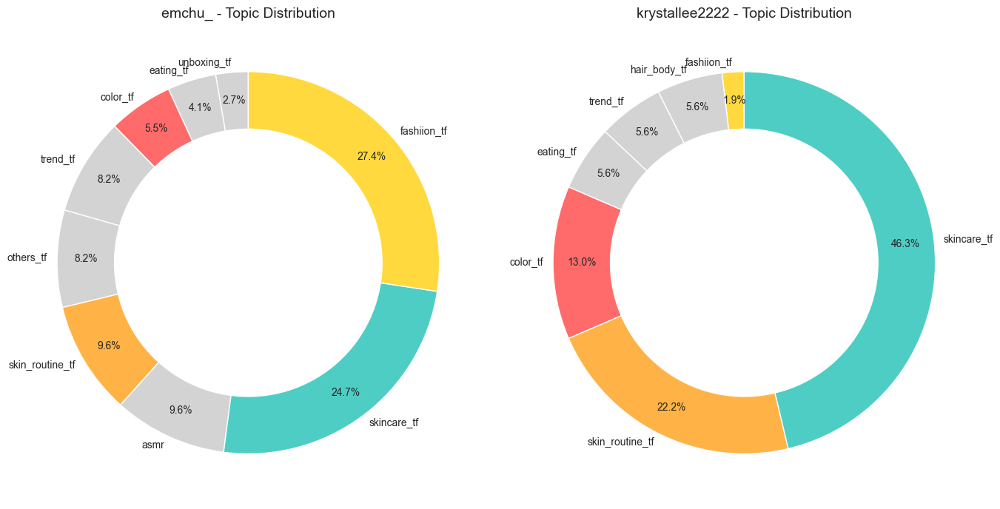

emchu_ Top 3 Topics:
1. fashiion_tf
2. skincare_tf
3. skin_routine_tf

----------------------------------------

krystallee2222 Top 3 Topics:
1. skincare_tf
2. skin_routine_tf
3. color_tf

----------------------------------------



In [100]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("whitegrid")

color_mapping = {
    'color_tf': '#FF6B6B',        # 강조: 진한 빨강
    'skincare_tf': '#4ECDC4',     # 강조: 청록 (일반 스킨케어)
    'hair_body_tf': '#D3D3D3',    # 톤 다운
    'fashiion_tf': '#FFD93D',     # 강조: 노랑
    'unboxing_tf': '#D3D3D3',     # 톤 다운
    'skin_routine_tf': '#FFB347', # 강조: 오렌지 (스킨 루틴 별도)
    'trend_tf': '#D3D3D3',        # 톤 다운
    'asmr': '#D3D3D3',            # 톤 다운
    'eating_tf': '#D3D3D3',       # 톤 다운
    'others_tf': '#D3D3D3'        # 톤 다운
}

selected_influencers = influencer_counts[influencer_counts['name'].isin(['krystallee2222', 'emchu_'])]

# subplot 생성: 1행 2열
fig, axes = plt.subplots(1, len(selected_influencers), figsize=(14,7))

if len(selected_influencers) == 1:  # 인플루언서가 1명일 때
    axes = [axes]

for ax, (_, row) in zip(axes, selected_influencers.iterrows()):
    name = row['name']
    topic_cols = influencer_counts.columns[1:11]
    counts = row[topic_cols]
    
    counts = counts[counts > 0].sort_values(ascending=True)
    colors = [color_mapping[col] for col in counts.index]
    
    wedges, texts, autotexts = ax.pie(
        counts, 
        labels=counts.index, 
        autopct='%1.1f%%', 
        startangle=90,
        colors=colors,
        textprops={'fontsize': 10},
        pctdistance=0.85,
        labeldistance=1.05
    )
    
    # 도넛형
    centre_circle = plt.Circle((0,0),0.70,fc='white')
    ax.add_artist(centre_circle)
    ax.set_title(f'{name} - Topic Distribution', fontsize=14)

plt.tight_layout()
plt.show()

# Top 3 토픽 출력
for _, row in selected_influencers.iterrows():
    print(f"{row['name']} Top 3 Topics:")
    print(f"1. {row['no.1']}")
    print(f"2. {row['no.2']}")
    print(f"3. {row['no.3']}")
    print("\n" + "-"*40 + "\n")

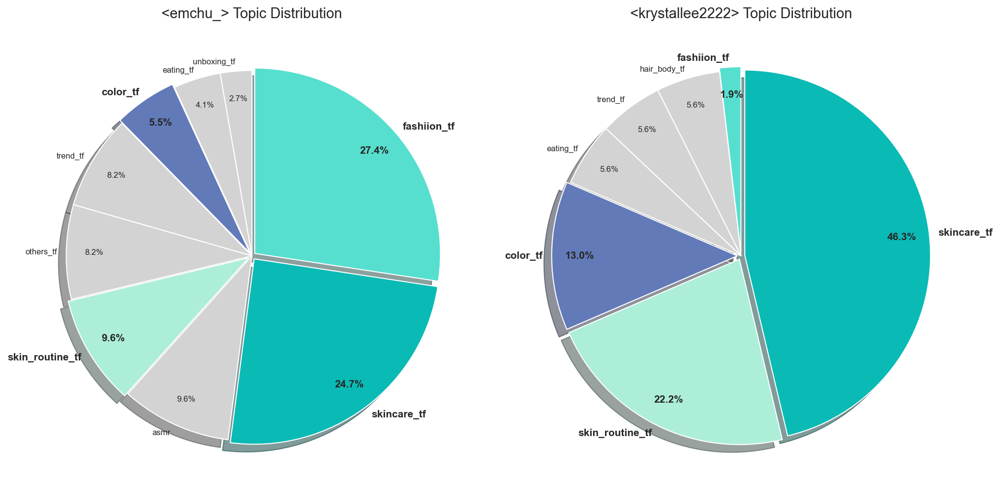

emchu_ Top 3 Topics:
1. fashiion_tf
2. skincare_tf
3. skin_routine_tf

----------------------------------------

krystallee2222 Top 3 Topics:
1. skincare_tf
2. skin_routine_tf
3. color_tf

----------------------------------------



In [101]:
import matplotlib.pyplot as plt

# 색상 매핑
color_mapping = {
    'color_tf': '#637AB9',        # 강조: 진한 빨강
    'skincare_tf': '#0ABAB5',     # 강조: 청록
    'hair_body_tf': '#D3D3D3',    # 톤 다운
    'fashiion_tf': '#56DFCF',     # 강조: 노랑
    'unboxing_tf': '#D3D3D3',     # 톤 다운
    'skin_routine_tf': '#ADEED9', # 강조: 오렌지
    'trend_tf': '#D3D3D3',        # 톤 다운
    'asmr': '#D3D3D3',            # 톤 다운
    'eating_tf': '#D3D3D3',       # 톤 다운
    'others_tf': '#D3D3D3'        # 톤 다운
}

selected_influencers = influencer_counts[influencer_counts['name'].isin(['krystallee2222', 'emchu_'])]

# subplot: 1행 2열, dpi 높게
fig, axes = plt.subplots(1, len(selected_influencers), figsize=(14,7), dpi=150)

if len(selected_influencers) == 1:
    axes = [axes]

for ax, (_, row) in zip(axes, selected_influencers.iterrows()):
    name = row['name']
    topic_cols = influencer_counts.columns[1:11]
    counts = row[topic_cols]
    
    # 0 값 제거 + 오름차순 정렬
    counts = counts[counts > 0].sort_values(ascending=True)
    
    colors = [color_mapping[col] for col in counts.index]
    explode = [0.02 if col in ['color_tf','skincare_tf','skin_routine_tf','fashiion_tf'] else 0 for col in counts.index]
    
    wedges, texts, autotexts = ax.pie(
        counts, 
        labels=counts.index,
        autopct='%1.1f%%',
        startangle=90,
        colors=colors,
        explode=explode,
        shadow=True,
        pctdistance=0.85,
        labeldistance=1.05
    )
    
    # 레이블 글자 크기 조정
    for i, text in enumerate(texts):
        if counts.index[i] in ['color_tf','skincare_tf','skin_routine_tf','fashiion_tf']:
            text.set_fontsize(10)
            text.set_weight('bold')
        else:
            text.set_fontsize(8)
            text.set_weight('light')
    
    # 퍼센트 글자 크기 조정
    for i, at in enumerate(autotexts):
        if counts.index[i] in ['color_tf','skincare_tf','skin_routine_tf','fashiion_tf']:
            at.set_fontsize(10)
            at.set_weight('bold')
        else:
            at.set_fontsize(8)
            at.set_weight('light')
    
    ax.set_title(f'<{name}> Topic Distribution', fontsize=14)

plt.tight_layout()
plt.show()

# Top 3 토픽 출력
for _, row in selected_influencers.iterrows():
    print(f"{row['name']} Top 3 Topics:")
    print(f"1. {row['no.1']}")
    print(f"2. {row['no.2']}")
    print(f"3. {row['no.3']}")
    print("\n" + "-"*40 + "\n")

## PART 3: Tiktoker recommend

In [102]:
mean_df = mean_df.merge(influencer_counts, on='name', how='left')

In [103]:
# 쉼표 제거 및 숫자로 변환
cols_to_int = ["follower_cnt", "view_cnt", "like_cnt", "comment_cnt", "save_cnt", "ad_cost"]
cols_to_float = ["ER", "avg_upload_interval"]

# int로 변환할 컬럼
mean_df[cols_to_int] = mean_df[cols_to_int].replace(",", "", regex=True).astype(float).round(0).astype(int)

# float (소수 둘째 자리까지)로 변환할 컬럼
mean_df[cols_to_float] = mean_df[cols_to_float].replace(",", "", regex=True).astype(float).round(2)
mean_df.head(3)

KeyError: "['avg_upload_interval'] not in index"

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import MinMaxScaler


final_df3 = mean_df.copy()

scaler = MinMaxScaler()
final_df3['normalized_ER'] = scaler.fit_transform(final_df3[['ER']])

# 콘텐츠 컬럼 가중치 반영하여 합치기
# ER가 너무 낮으면 가중치 값이 0이 되어 콘텐츠 키워드가 삭제될 위험 있음
# 이를 방지하려면 최소 1번은 반영되도록 max(1, int(...)) 적용
final_df3['content_features'] = final_df3.apply(lambda x: 
    (x['no.1'] + ' ') * max(1, int(round(x['normalized_ER'] * 3, 0))) + 
    (x['no.2'] + ' ') * max(1, int(round(x['normalized_ER'] * 2, 0))) + 
    (x['no.3'] + ' ') * max(1, int(round(x['normalized_ER'], 0))),
    axis=1) 

# TF-IDF 변환
vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(final_df3['content_features'])

# 기존 선택한 인플루언서 기준 유사도 측정
selected_influencers = ["krystallee2222", "emchu_"]
selected_indices = final_df3[final_df3['name'].isin(selected_influencers)].index
similarity_scores = cosine_similarity(tfidf_matrix, tfidf_matrix[selected_indices])

# 평균 유사도 점수 계산 후 정렬
final_df3["content_similarity"] = similarity_scores.mean(axis=1)
df_sorted = final_df3.sort_values(by="content_similarity", ascending=False)
df_sorted

# 최종 추천 인플루언서 리스트
top_n = 15  # 원하는 추천 개수
recommended_influencers = df_sorted.loc[~df_sorted['name'].isin(selected_influencers)].head(top_n)
display(recommended_influencers[["name", "content_similarity"]])

,name,content_similarity
14,cleangirlhacks,0.73
28,jasminnlily_,0.73
13,caspertheghostyy,0.73
36,minseonk1m,0.73
1,.m.egan,0.73
24,its.kaylas,0.73
17,dearwonii_,0.73
10,ayheyt3u,0.73
51,thelipstickgirly,0.66
37,misscasxie,0.62


2025년 이후 : jasminnlily_,caspertheghostyy, minseonk1m, dearwonii_, thelipstickgirly, 
2024 년도 이전 : .blissdiaries, 

6 / 13

추적 관찰한 결과 50% 가 torriden의 광고를 제의 받음.

In [104]:
import pandas as pd
from scipy.stats import chi2_contingency

# 브랜드별 상위 키워드 (TF-IDF 기반 예시)
data = {
    "Brand": ["자사", "Dr.Jart+", "COSRX", "I’m From", "조선미녀", "PURITO"],
    "Keywords": [
        ["hydrated", "calming", "smooth", "absorption", "gentle", "soft", "cream", "soothing", "lightweight", "moisturizer"],
        ["moisturizing", "calming", "cream", "hydration", "soothing", "gentle", "smooth", "sensitive", "formula", "barrier"],
        ["snail", "cica", "acne", "calming", "routine", "irritation", "redness", "soothing", "effect", "skin"],
        ["natural", "gentle", "calming", "absorption", "soft", "smooth", "cream", "lightweight", "effect", "soothing"],
        ["glow", "antioxidant", "radiance", "gentle", "moisturizing", "cream", "brightening", "effect", "smooth", "soothing"],
        ["gentle", "oat", "sensitive", "soothing", "cream", "moisturizing", "soft", "absorption", "effect", "lightweight"]
    ]
}

df = pd.DataFrame(data)

# 전체 키워드 목록 생성
all_keywords = sorted({kw for kws in df["Keywords"] for kw in kws})

# 키워드 등장 여부를 Binary Matrix로 변환
binary_matrix = pd.DataFrame(0, index=df["Brand"], columns=all_keywords)
for i, row in df.iterrows():
    for kw in row["Keywords"]:
        binary_matrix.loc[row["Brand"], kw] = 1

print("🔹 브랜드별 키워드 Binary Matrix:\n")
print(binary_matrix.head())

# Chi-square test 수행
chi2, p, dof, expected = chi2_contingency(binary_matrix)

print("\n🔹 Chi-square 검정 결과:")
print(f"Chi2 통계량: {chi2:.3f}")
print(f"p-value: {p:.5f}")
print(f"자유도: {dof}")
if p < 0.05:
    print("➡ 귀무가설 기각: 브랜드 간 키워드 분포에 유의한 차이가 있음.")
else:
    print("➡ 귀무가설 채택: 브랜드 간 키워드 분포에 유의한 차이가 없음.")


🔹 브랜드별 키워드 Binary Matrix:

          absorption  acne  antioxidant  barrier  brightening  calming  cica  \
Brand                                                                          
자사                 1     0            0        0            0        1     0   
Dr.Jart+           0     0            0        1            0        1     0   
COSRX              0     1            0        0            0        1     1   
I’m From           1     0            0        0            0        1     0   
조선미녀               0     0            1        0            1        0     0   

          cream  effect  formula  ...  oat  radiance  redness  routine  \
Brand                             ...                                    
자사            1       0        0  ...    0         0        0        0   
Dr.Jart+      1       0        1  ...    0         0        0        0   
COSRX         0       1        0  ...    0         0        1        1   
I’m From      1       1        0  ...    0

In [105]:
tiktoker_df.head(1)

,name,follower_cnt,upload_date,view_cnt,like_cnt,comment_cnt,save_cnt,info,hash_tag,cleaned_info,...,stpw_processed_hash_tag,tiktoker_size,ad_cost,prev_date,upload_gap,upload_gap_diff,avg_upload_gap_change,upload_date_str,upload_y_m,topic
299,.blissdiaries,81700.00,2024-09-23,9209,807,48,92,I recieved this product for free from picky an...,"@Picky,@Picky,@numbuzin,#foryou,#pickyreview,#...",i recieved this product for free from picky an...,...,[foryoupickyreviewgopickypickyxnumbuzinnumbuzi...,micro_influancer,1634000000.00,NaT,NaN,NaN,-0.11,2024-09-23,2024-09,"스킨케어 & 피부 관리, 패션 & 스타일링, ASMR & 감성 콘텐츠"


In [106]:
keyword_df.head(1)

,search_term,vedio_order,tiktoker_name,upload_date,like_cnt,comment_cnt,save_cnt,info,hash_tag,cleaned_info,cleaned_hash_tag,tokenized_info,tokenized_hash_tag,removed_info,removed_hash_tag,stpw_processed_info,stpw_processed_hash_tag,upload_date_str,upload_y_m
0,clean_beauty,1,morganlkeen,2024-09-05,1563,73,894,Replying to @user8022071884889 Non-Toxic Makeu...,@user8022071884889,replying to nontoxic makeup blushes powder cr...,,"[replying, to, nontoxic, makeup, blushes, powd...",[],"[replying, nontoxic, makeup, blushes, powder, ...",[],"[repli, nontox, makeup, blush, powder, cream, ...",[],2024-09-05,2024-09
